You are given a dataset of credit card transactions. The dataset contains 8500 customers and their activity over a 6-month period. Each transaction is characterized by 18 features described below.

Your task is to find the most useful customer segmentation to improve the marketing campaigns of the company.

###The features:

- **customer_id** : id of the credit card holder

- **balance_account** : balance amount left in the account to make purchases at the end of the 6-month period
  - How much money is left in the account after 6 months.

- **balance_frequency_update** : how frequently the balance has been updated, score between 0 and 1 (1 = frequently-updated, 0 = not frequently updated)

- **cash_advance_frequency** : how frequently the cash in advance being paid


- **full_purchases** : maximum purchase amount done in full payment

- **full_purchases_frequency** : how frequently purchases are happening in full - payment (1 = frequently purchased, 0 = not frequently purchased)

- **purchases_amount** : amount of purchases made from account

- **paid_advance** : number of transactions made with “Cash in Advance” method

- payments : amount of payment done by user

- **purchases_frequency** : how frequently the purchases are being made, score - between 0 and 1 (1 = frequently-purchased, 0 = not frequently purchased)

- **purchases_installments_frequency** : how frequently purchases in installments are being done (1 = frequently-done, 0 = not frequently done)


- installments : amount of purchases done in installments
- nr_cash_advances : cash in advance given by the user
- nr_purchases : number of purchase transactions made
- credit_limit : limit of credit card for user
- fixed_rate_period : duration of fixed interest rate of credit card service for user (in months)
- min_payments : minimum amount of payments made by user
- full_payment_prc : percent of full payment paid by user



In [ ]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

In [ ]:
data = pd.read_csv('https://drive.google.com/uc?export=download&id=1TU-HZ_FdvGge8AfSuaT5LtmSJSbAfKhc')
data.head(20)

,customer_id,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,tGEg8fT2eCgVxdwS,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571
1,stEDu20sSKOXomjg,52.666422,150.30,0.000000,0.00,1.000000,150.30,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000
2,CEB2blrN3b88GsRe,1360.795674,0.00,462.861443,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000
3,0N0eBl8ySaZThxKE,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000
4,6NLauoHUwtwOv4Wy,22.322374,95.00,1162.045833,95.00,0.363636,0.00,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000
5,3Zx75mmL4wXFf36M,9266.080540,100.00,4383.296268,0.00,1.000000,100.00,0.333333,0.000000,0.250000,0.166667,3,4,17500.0,12,2444.123547,2603.406476,0.000000
6,VIncqsQDzbMSsvL9,97.389327,60.00,0.000000,60.00,1.000000,0.00,0.083333,0.083333,0.000000,0.000000,0,1,12500.0,12,453.421982,204.880010,0.000000
7,fDoLh1FTtFMuu3xs,4788.283283,0.00,437.808586,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.166667,2,0,5000.0,12,823.840717,1934.821741,0.000000
8,OpclyuJ9WGTLImw1,319.037744,1262.28,0.000000,1262.28,0.818182,0.00,0.250000,0.250000,0.000000,0.000000,0,6,10500.0,12,1350.541585,218.810614,0.125000
9,k2GbzBNCo0TQmwaw,1641.251218,0.00,2990.165538,0.00,0.727273,0.00,0.000000,0.000000,0.000000,0.166667,4,0,3000.0,12,4399.723425,500.276155,0.142857


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       8500 non-null   object 
 1   balance_account                   8500 non-null   float64
 2   purchases_amount                  8500 non-null   float64
 3   paid_advance                      8500 non-null   float64
 4   full_purchases                    8500 non-null   float64
 5   balance_frequency_update          8500 non-null   float64
 6   installments                      8500 non-null   float64
 7   purchases_frequency               8500 non-null   float64
 8   full_purchases_frequency          8500 non-null   float64
 9   purchases_installments_frequency  8500 non-null   float64
 10  cash_advance_frequency            8500 non-null   float64
 11  nr_cash_advances                  8500 non-null   int64  
 12  nr_pur

In [ ]:
data.describe()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
count,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8499.000000,8500.000000,8500.000000,8202.000000,8500.000000
mean,1565.941403,999.561312,973.508540,588.165365,0.876272,411.708492,0.489383,0.201940,0.363796,0.135288,3.253647,14.677059,4485.848704,11.516118,1721.250989,865.594683,0.152587
std,2090.513302,2154.189460,2078.539061,1669.466184,0.237517,910.142440,0.401075,0.297756,0.397162,0.200892,6.854883,25.001561,3629.804040,1.339121,2893.200899,2389.297977,0.291505
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,6.000000,0.000000,0.019163,0.000000
25%,126.318369,39.000000,0.000000,0.000000,0.875000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1500.000000,12.000000,381.893717,168.712104,0.000000
50%,869.046468,360.000000,0.000000,37.400000,1.000000,89.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,12.000000,851.146952,310.399040,0.000000
75%,2053.674410,1105.897500,1113.726110,570.410000,1.000000,466.725000,0.916667,0.285714,0.750000,0.222222,4.000000,17.000000,6500.000000,12.000000,1897.014052,826.426929,0.142857
max,19043.138560,49039.570000,47137.211760,40761.250000,1.000000,22500.000000,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,12.000000,50721.483360,76406.207520,1.000000


In [ ]:
data = data.drop_duplicates(keep = 'first')
data.shape

(8500, 18)



*   No NaNs
*   No duplicates



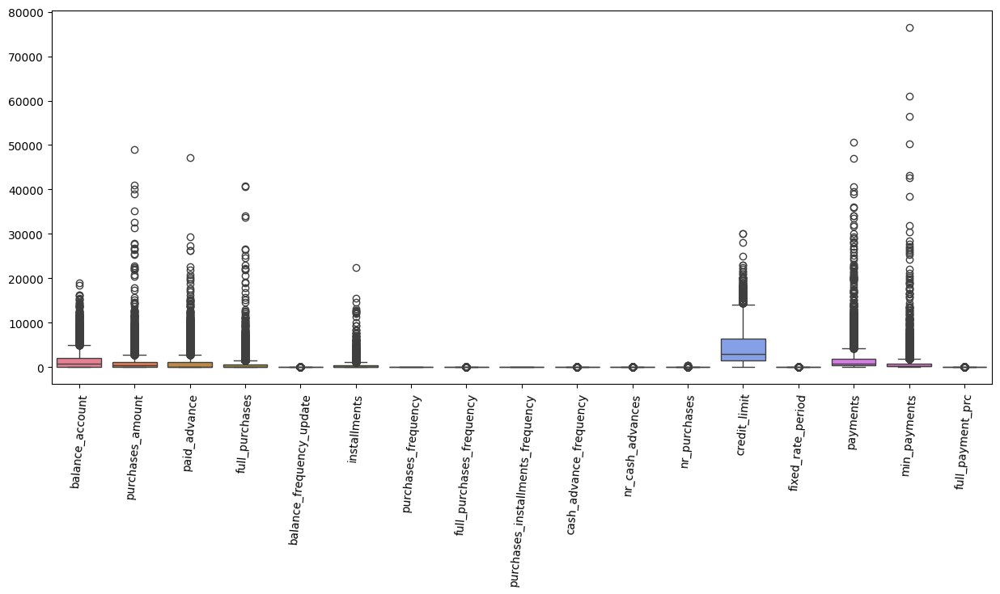

In [ ]:
plt.subplots(figsize = (15,6))

sns.boxplot(data)

plt.xticks(rotation=85)

plt.show()

In [ ]:
num_cols = list()
data_temp = data.drop(columns = 'customer_id')
for col in data_temp.columns:
    num_cols.append(col)

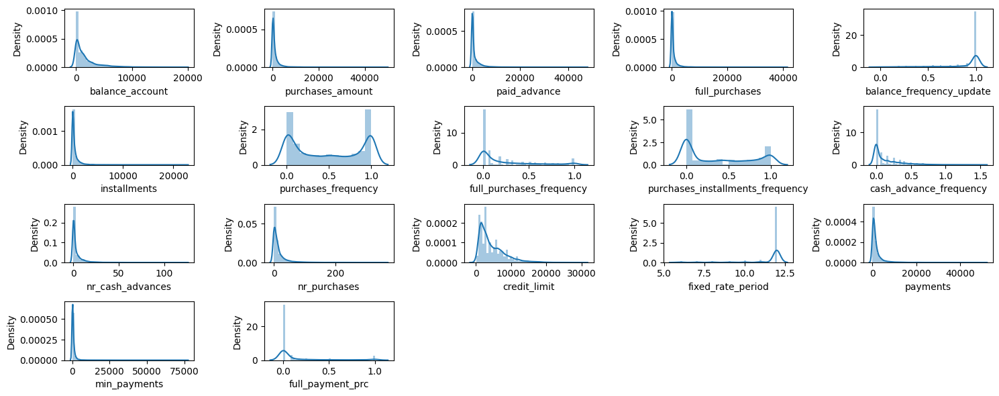

In [ ]:
plt.figure(figsize=(15, 6))

for i, col in enumerate(num_cols):
    plt.subplot(4, 5, i+1)
    sns.distplot(data_temp[col])

plt.tight_layout()
plt.show()

Right-skewed:
- Balance account: balance amount left in the account to make purchases at the end of the 6-month period about 1565 USD
- Purchase amount
- paid advance
- Full purchases
- Installments
- Full-purchases freq
- Cash advance freq
- Nr cash advances
- Nr purchases
- Credit limit
- Payments
- Min payments

Bimodal:
- Purchasess freq
- Purchases installments freq

Left-skewed:
- balance freq update
- fixed rate period


## Correlation matrix

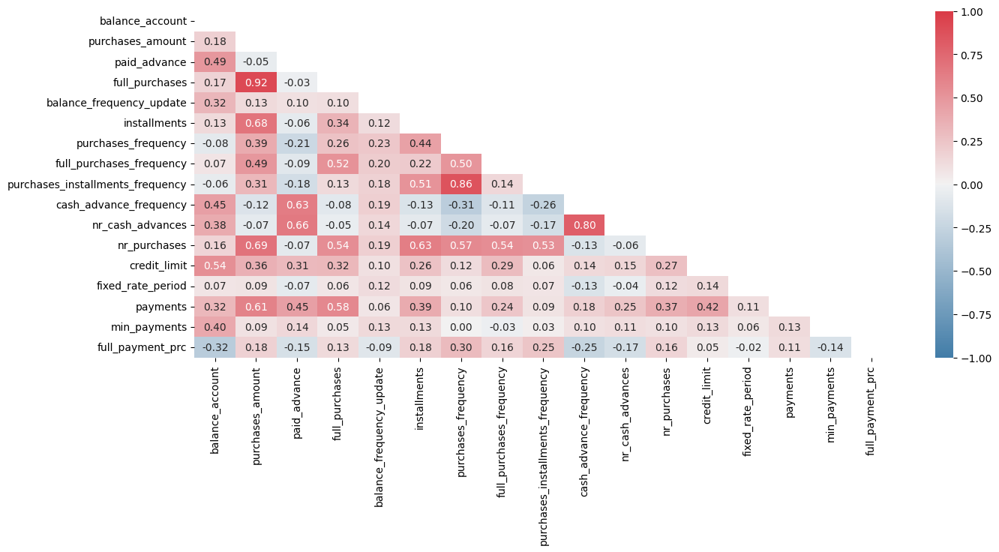

In [ ]:
plt.subplots(figsize=(15, 6))

correlation_matrix = data_temp.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle

colormap = sns.diverging_palette(240, 10, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask = mask,
    vmin = -1,
    vmax = 1,
    cmap = colormap,
    annot = True,
    fmt=".2f",
    );

Highly correlated features that can indicate 3 types of customers:

1. Customer that use their credit cards to make **full purchases**
   -  Full purchases with purchase amount --> maximum purchase amount done in full payment with amount of purchases made from account

  - Customers who make more full purchases (no installments) tend to have a higher maximum single full-payment transaction.

  - This correlation could indicate a spending behavior where customers who pay in full also tend to make larger purchases.

2. Customer that use their credit cards to make purchases **in installments**

    - Purchase installments frequency with purchase frequency. Similarly, The more frequently purchases in installments are being done the more frequent purchases are being made.

3. Customers who use their credit cards to **take cash in advance**
    - nr cash advance and cash advance frequency --> cash in advance given by the user with how frequently the cash in advance being paid

    - Customers who take larger cash advances tend to repay them more frequently.
    - This could indicate that users who rely on cash advances actively manage their repayments, possibly to avoid high interest.


## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

In [ ]:
sc = StandardScaler()

data_scaled = sc.fit_transform(data_temp)
data_scaled = pd.DataFrame(data_scaled, columns = data_temp.columns)

In [ ]:
data_scaled.head()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,-0.744666,-0.414083,-0.468389,-0.352328,0.138183,-0.334153,1.046519,-0.678245,1.144149,-0.673477,-0.474675,-0.187082,-0.960397,-0.385438,-0.563901,-0.324752,0.946810
1,-0.723920,-0.394260,-0.468389,-0.352328,0.520953,-0.287234,1.273196,-0.678245,1.182300,-0.673477,-0.474675,-0.347081,-0.960397,-4.119450,-0.576049,-0.327580,-0.523476
2,-0.098138,-0.464035,-0.245690,-0.352328,0.520953,-0.452383,-1.220250,-0.678245,-0.916043,0.684186,0.400665,-0.587080,-0.822641,-0.385438,-0.490219,-0.176554,-0.523476
3,0.217997,-0.295433,-0.468389,-0.134773,0.520953,-0.452383,1.273196,2.680406,-0.916043,-0.673477,-0.474675,-0.067082,-0.684884,0.361364,-0.351538,-0.029188,-0.523476
4,-0.738436,-0.419933,0.090712,-0.295420,-2.158437,-0.452383,-1.012464,-0.398359,-0.916043,0.156208,-0.037005,-0.547080,-0.547127,0.361364,0.820251,-0.345500,-0.523476


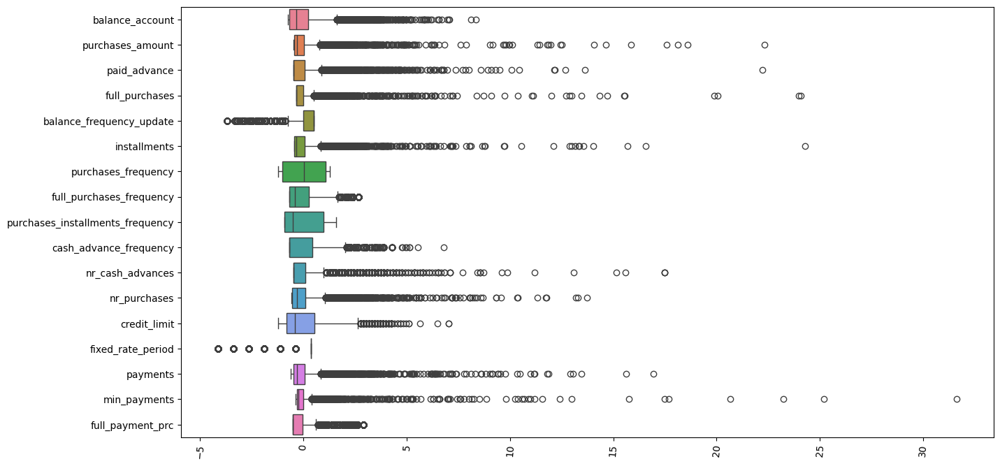

In [ ]:
plt.subplots(figsize = (15, 8))

sns.boxplot(data_scaled, orient = 'h')

plt.xticks(rotation=85)

plt.show()

## Handling Nans

In [ ]:
np.isnan(data_scaled).sum()


,0
balance_account,0
purchases_amount,0
paid_advance,0
full_purchases,0
balance_frequency_update,0
installments,0
purchases_frequency,0
full_purchases_frequency,0
purchases_installments_frequency,0
cash_advance_frequency,0


In [ ]:
imputer = KNNImputer()
data_clean = imputer.fit_transform(data_scaled)
data_clean = pd.DataFrame(data_clean, columns = data_temp.columns)

In [ ]:
np.isnan(data_clean).sum()

,0
balance_account,0
purchases_amount,0
paid_advance,0
full_purchases,0
balance_frequency_update,0
installments,0
purchases_frequency,0
full_purchases_frequency,0
purchases_installments_frequency,0
cash_advance_frequency,0


## Ward hierarchical clustering

ref: https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster import AgglomerativeClustering

In [ ]:
linkage_matrix = linkage(data_clean, method='ward')  # 'ward' minimizes variance within clusters
linkage_matrix #linkage matrix, which stores the hierarchical clustering information

array([[5.27000000e+02, 5.95900000e+03, 4.01783600e-03, 2.00000000e+00],
       [1.89400000e+03, 4.76700000e+03, 5.04571024e-03, 2.00000000e+00],
       [2.56500000e+03, 4.31000000e+03, 9.97213654e-03, 2.00000000e+00],
       ...,
       [1.69680000e+04, 1.69950000e+04, 1.42701630e+02, 3.47400000e+03],
       [1.69890000e+04, 1.69940000e+04, 1.59302757e+02, 5.02600000e+03],
       [1.69960000e+04, 1.69970000e+04, 1.99598925e+02, 8.50000000e+03]])

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(data_clean)
model

AgglomerativeClustering(distance_threshold=0, n_clusters=None)

In [ ]:
def plot_dendrogram(model, **kwargs):

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # linkage matrix
    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

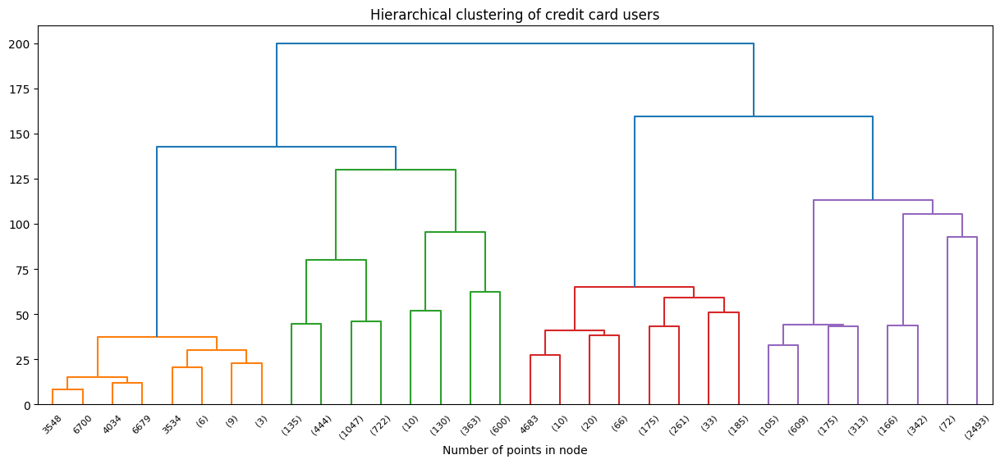

In [ ]:
plt.subplots(figsize = (15, 6))

plt.title("Hierarchical clustering of credit card users")

# plot the top four levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=4)
plt.xlabel("Number of points in node")
plt.show()

- If clusters merge at a very low height, they are very similar (close to each other).
- If they merge at a high height, they are less similar.
- I think the blue vertical lines are quite long so the blue merges may not be optimal
- What about the far right purple?

## Choosing the number of clusters

### Elbow method

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.pipeline import Pipeline

In [ ]:
ward_pipeline = Pipeline([
     ('scaler', StandardScaler()),
     ('imputer', KNNImputer()),
     ('cluster', AgglomerativeClustering(n_clusters=None))
    ])

ward_pipeline

Pipeline(steps=[('scaler', StandardScaler()), ('imputer', KNNImputer()),
                ('cluster', AgglomerativeClustering(n_clusters=None))])

In [ ]:
"""
cluster_errors = []

for n_clusters in range(2, 16):
    ward_pipeline.fit(data_clean)

    wcsse = ward_pipeline.named_steps["cluster"].inertia_
    print('nb if clusters = ', n_clusters, '\tWCSS Err. = ', wcsse) #within-cluster sum of squares aka variance
    cluster_errors.append(wcsse)
"""

'\ncluster_errors = []\n\nfor n_clusters in range(2, 16): \n    ward_pipeline.fit(data_clean)\n    \n    wcsse = ward_pipeline.named_steps["cluster"].inertia_ \n    print(\'nb if clusters = \', n_clusters, \'\tWCSS Err. = \', wcsse) #within-cluster sum of squares aka variance\n    cluster_errors.append(wcsse)\n'

The elbow method can't be used because hierarchichal clustering doesn't have intertia_ method. So I will just try silhouette.

## Silhouette method

In [ ]:
silhouette_s = []

for n_clusters in range(2, 21):
    ward_pipeline.named_steps["cluster"].n_clusters = n_clusters

    ward_pipeline.fit(data_clean)
    cluster_labels = ward_pipeline.named_steps["cluster"].labels_

    print("For n_clusters =", n_clusters,"The average silhouette_score is :", silhouette_score(data_clean, cluster_labels).round(4))
    silhouette_s.append(silhouette_score(data_clean, cluster_labels))


For n_clusters = 2 The average silhouette_score is : 0.1763
For n_clusters = 3 The average silhouette_score is : 0.1747
For n_clusters = 4 The average silhouette_score is : 0.1459
For n_clusters = 5 The average silhouette_score is : 0.1503
For n_clusters = 6 The average silhouette_score is : 0.1635
For n_clusters = 7 The average silhouette_score is : 0.1398
For n_clusters = 8 The average silhouette_score is : 0.1472
For n_clusters = 9 The average silhouette_score is : 0.1576
For n_clusters = 10 The average silhouette_score is : 0.161
For n_clusters = 11 The average silhouette_score is : 0.1643
For n_clusters = 12 The average silhouette_score is : 0.168
For n_clusters = 13 The average silhouette_score is : 0.1581
For n_clusters = 14 The average silhouette_score is : 0.1647
For n_clusters = 15 The average silhouette_score is : 0.166
For n_clusters = 16 The average silhouette_score is : 0.1516
For n_clusters = 17 The average silhouette_score is : 0.1531
For n_clusters = 18 The average sil

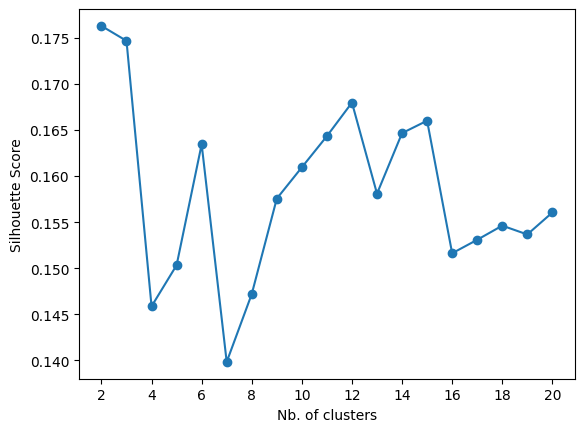

In [ ]:
plt.plot(range(2, 21, 1),silhouette_s, "o-")
plt.xlabel("Nb. of clusters")
plt.ylabel("Silhouette Score")
plt.xticks(range(2, 21, 2))
plt.show()

Looks like 4 clusters would be the optimal number of clusters. Let's have a look at the cluster sizes.

In [ ]:
X=data_clean.values

For n_clusters = 2 The average silhouette_score is : 0.1763
For n_clusters = 3 The average silhouette_score is : 0.1747
For n_clusters = 4 The average silhouette_score is : 0.1459
For n_clusters = 5 The average silhouette_score is : 0.1503
For n_clusters = 6 The average silhouette_score is : 0.1635
For n_clusters = 7 The average silhouette_score is : 0.1398
For n_clusters = 8 The average silhouette_score is : 0.1472




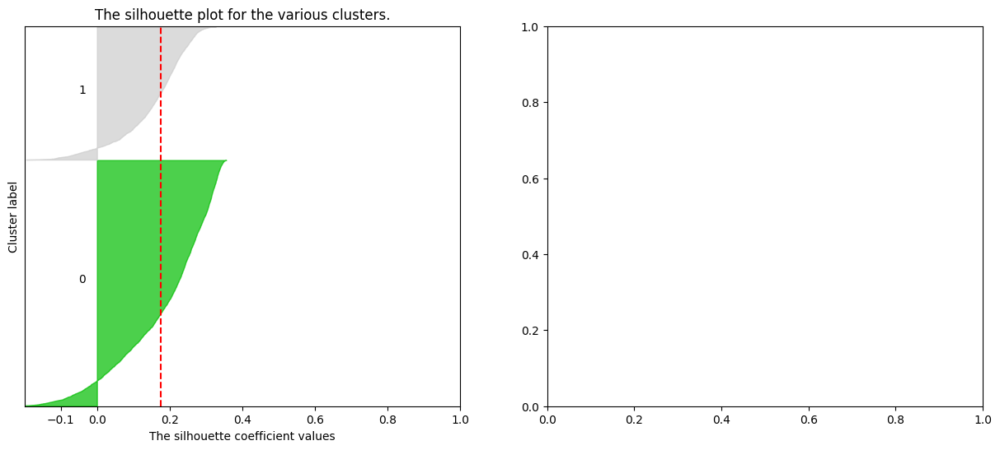

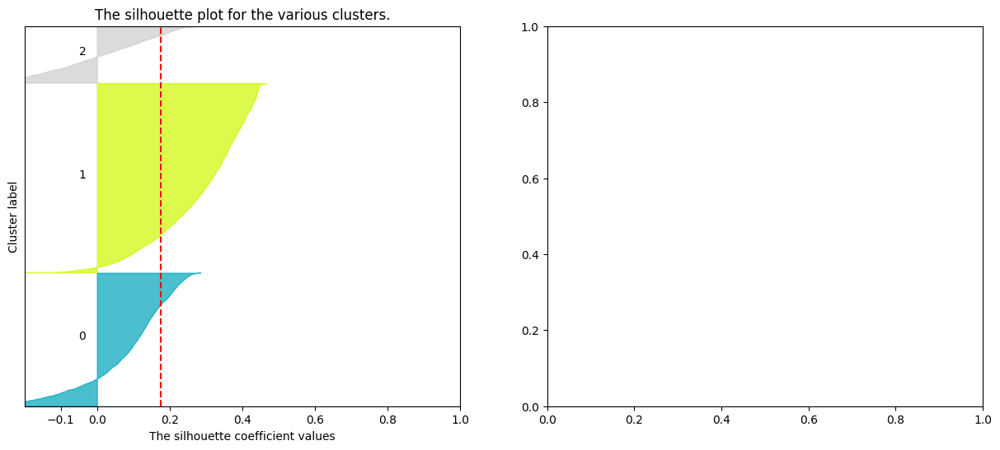

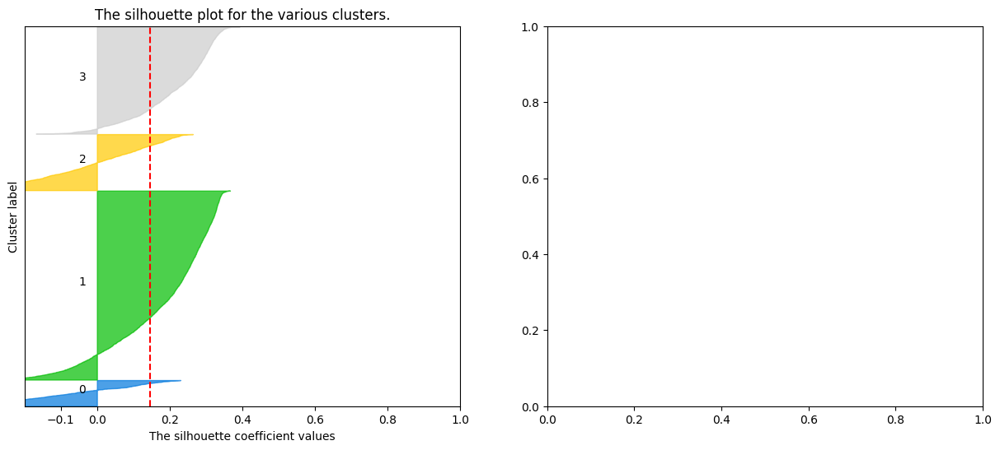

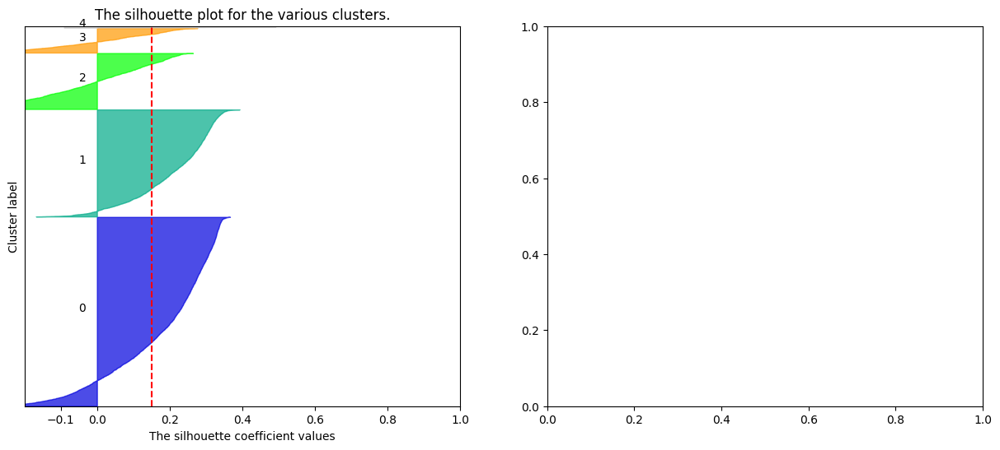

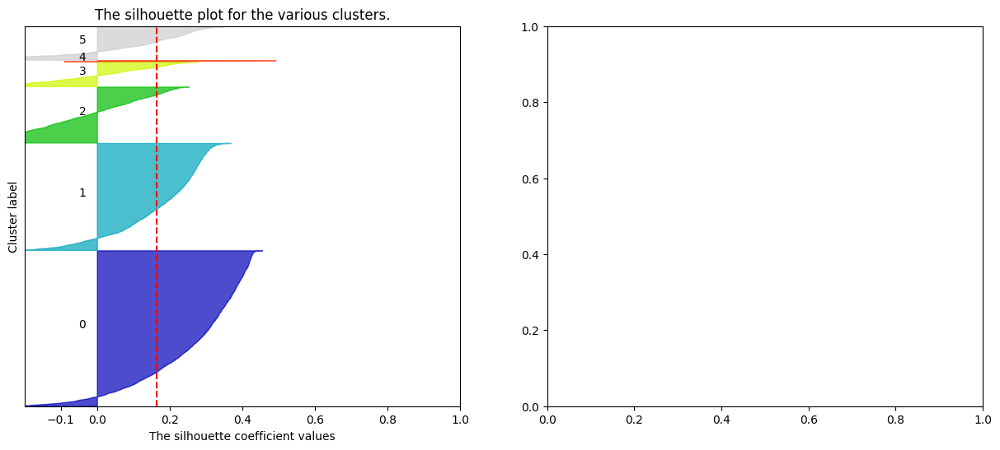

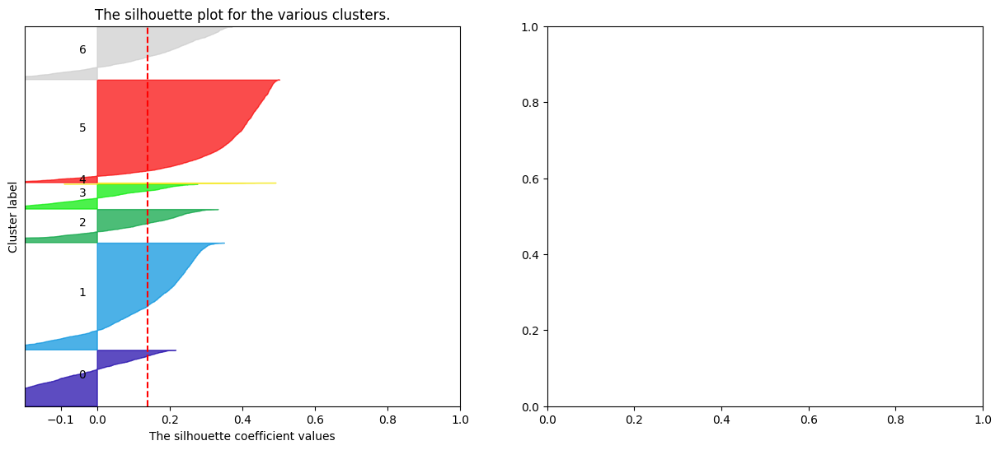

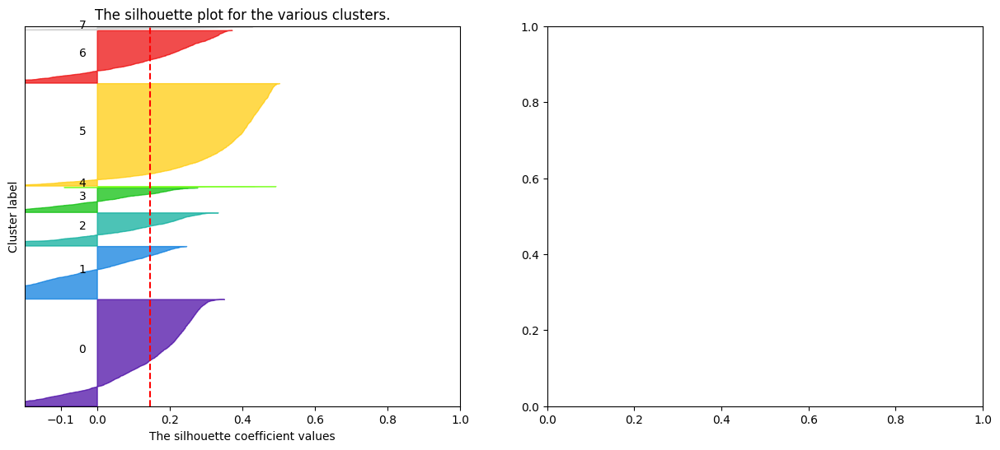

In [ ]:
range_n_clusters = range(2, 9)

r_seed = 42

cols = data_clean.columns

for n_clusters in range_n_clusters:

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 6)

    # The silhouette coefficient can range from -1, 1 but in this example all lie within [-0.2, 1]
    ax1.set_xlim([-0.2, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the Pipeline with n_clusters value and a random generator seed for reproducibility.
    ward_pipeline.named_steps["cluster"].n_clusters = n_clusters

    ward_pipeline.fit(X)
    cluster_labels = ward_pipeline.named_steps["cluster"].labels_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =",
          n_clusters,
          "The average silhouette_score is :",
          silhouette_avg.round(4))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i + 1) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0,
                          ith_cluster_silhouette_values,
                          facecolor=color,
                          edgecolor=color,
                          alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

print("\n")
plt.show() #data lives in 16D but we look only at 2D

Actually 2 clusters looks better in datapoint distribution than 3 or 4 clusters.

# 3 Clusters
## Extracting clusters

In [ ]:
num_clusters = 3
clusters = fcluster(linkage_matrix, num_clusters, criterion='maxclust') # maximize the number of clusters so that the final number of clusters is equal to num_clusters.

clusters

array([1, 3, 3, ..., 3, 1, 1], dtype=int32)

In [ ]:
# Adding cluster labels to my df
data_clean['Cluster'] = clusters
data_clean.tail(10)

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
8490,-0.749114,-0.356239,-0.468389,-0.352328,-3.689515,-0.197243,1.273196,-0.678245,1.601969,-0.673477,-0.474675,-0.107082,-0.822641,0.361364,-0.451308,-0.352307,-0.523476,3
8491,0.087242,-0.464035,-0.392778,-0.352328,0.520953,-0.452383,-1.220250,-0.678245,-0.916043,-0.258637,-0.328785,-0.587080,-0.684884,0.361364,-0.408847,-0.159584,-0.523476,3
8492,-0.024424,-0.033194,-0.468389,0.147442,0.138183,-0.349360,1.046519,1.764411,1.144149,-0.673477,-0.474675,0.652915,0.003899,-0.385438,0.372150,-0.165656,-0.523476,1
8493,-0.747303,-0.402268,-0.468389,-0.335436,-1.010125,-0.337174,-0.181314,-0.118469,-0.286540,-0.673477,-0.474675,-0.387081,2.070248,0.361364,-0.522358,-0.320641,1.001265,3
8494,0.545887,0.472859,-0.468389,0.573310,0.520953,0.067237,0.649834,0.161418,0.762633,-0.673477,-0.474675,0.452916,0.692682,0.361364,0.295293,-0.085431,-0.523476,1
8495,-0.209690,-0.464035,-0.337957,-0.352328,0.520953,-0.452383,-1.220250,-0.678245,-0.916043,-0.258637,-0.328785,-0.587080,1.105952,0.361364,-0.366005,-0.253361,-0.523476,3
8496,-0.738872,-0.394534,-0.468389,-0.352328,0.520953,-0.287882,1.065410,-0.678245,1.392136,-0.673477,-0.474675,-0.147082,-0.822641,0.361364,-0.545890,-0.299309,0.048304,1
8497,-0.749114,-0.464035,-0.346235,-0.352328,-3.689515,-0.452383,-1.220250,-0.678245,-0.916043,-0.120355,-0.328785,-0.587080,-1.098154,-1.879043,0.247727,-0.317188,-0.523476,3
8498,0.038482,0.022181,-0.397831,0.275059,0.520953,-0.452383,0.234259,1.280967,-0.916043,0.156208,-0.182895,1.452912,-0.409371,0.361364,-0.434977,-0.154107,-0.523476,1
8499,0.141192,0.349339,-0.468389,0.496604,0.520953,-0.084419,1.065410,1.280967,0.762633,-0.673477,-0.474675,0.692915,-0.271614,0.361364,-0.339889,-0.179360,-0.523476,1


In [ ]:
data_clean['Cluster'].value_counts()

,count
Cluster,
3,4275
1,3474
2,751


a bit uneven

Because of my hypothesis for 3 clusters based on credit card user behavior I will explore nb clusters = 3 a bit more

In [ ]:
num_clusters = 3
clusters = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
data_clean3 = data_clean.copy()
data_clean3['Cluster'] = clusters
data_clean3['Cluster'].value_counts()

,count
Cluster,
3,4275
1,3474
2,751


## Exploring the features in the clusters a bit more

In [ ]:
data_w_clust = data.copy()
data_w_clust['Cluster'] = clusters
data_w_clust = data_w_clust.drop(columns='customer_id')

In [ ]:
df1=data_w_clust[data_w_clust['Cluster'] == 1]
df2=data_w_clust[data_w_clust['Cluster'] == 2]
df3=data_w_clust[data_w_clust['Cluster'] == 3]
df1.head(10)

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
0,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571,1
3,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000,1
14,3516.835582,4019.73,0.000000,1932.75,1.000000,2086.98,0.916667,0.916667,1.000000,0.000000,0,73,12000.0,12,3376.573790,910.942173,0.000000,1
15,179.882212,828.00,0.000000,0.00,1.000000,828.00,1.000000,0.000000,1.000000,0.000000,0,12,1000.0,12,649.951462,152.775223,0.300000,1
16,2739.711796,847.66,1201.188255,765.80,1.000000,81.86,1.000000,1.000000,0.583333,0.083333,1,20,7500.0,12,3273.326636,718.558976,0.000000,1
17,1361.815512,1309.72,814.086208,1106.81,1.000000,202.91,0.916667,0.750000,0.916667,0.750000,9,53,1700.0,12,1668.192483,585.993296,0.000000,1
22,486.661842,1898.88,0.000000,939.09,0.833333,959.79,0.833333,0.666667,0.666667,0.000000,0,24,1200.0,6,669.039640,336.880119,0.500000,1
25,293.118363,368.91,683.536421,0.00,1.000000,368.91,0.750000,0.000000,0.750000,0.166667,3,18,1800.0,12,1309.489418,195.953485,0.166667,1
26,1191.662907,979.92,0.000000,849.92,1.000000,130.00,0.750000,0.416667,0.416667,0.000000,0,18,4350.0,12,278.328435,470.064242,0.000000,1
27,28.329892,292.59,0.000000,292.59,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,12,5000.0,12,0.000000,NaN,0.000000,1


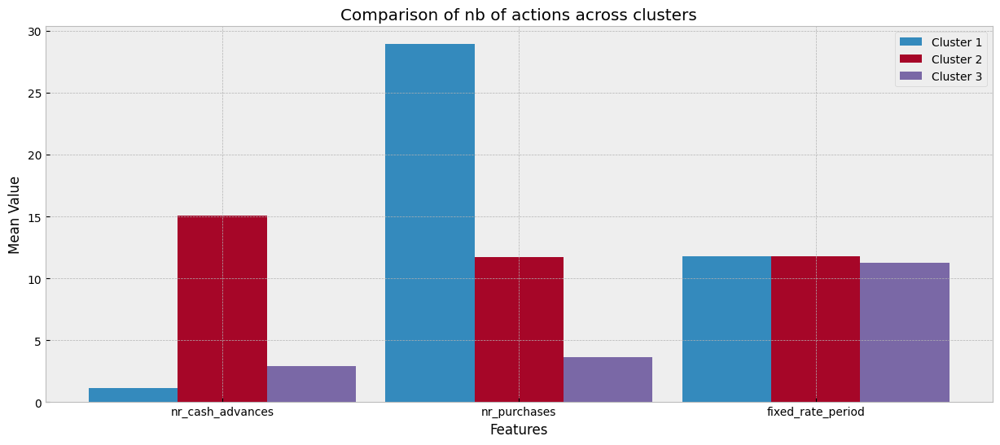

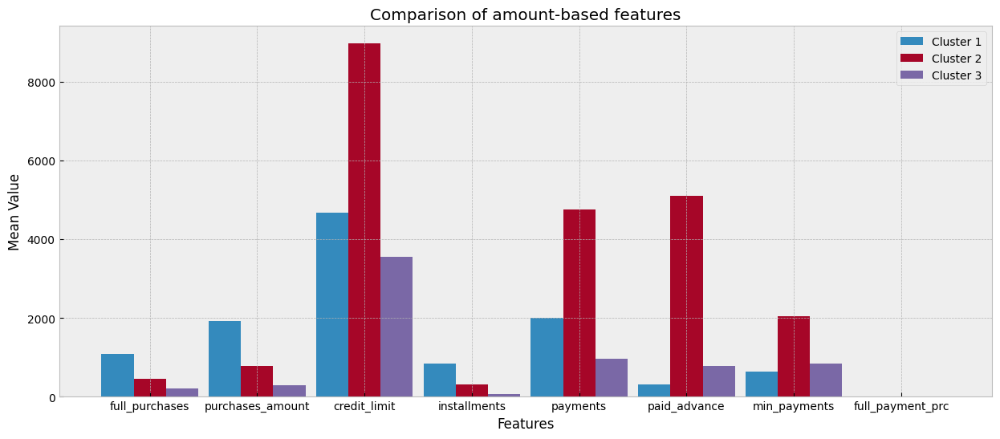

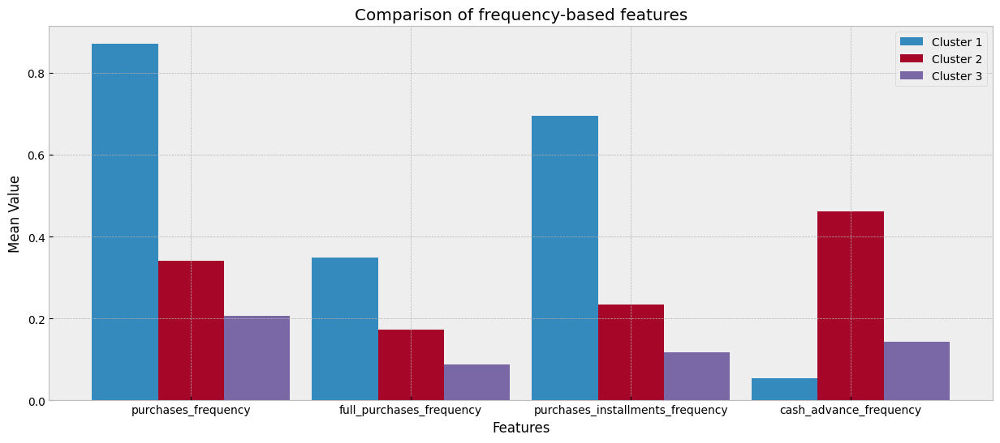

In [ ]:
def cluster_comp_plot(df):
    # Feature categories
    nb_columns = ['nr_cash_advances', 'nr_purchases', 'fixed_rate_period']
    amount_columns = ['full_purchases','purchases_amount' , 'credit_limit', 'installments',
                      'payments','paid_advance', 'min_payments', 'full_payment_prc']
    freq_columns = ['purchases_frequency', 'full_purchases_frequency', 'purchases_installments_frequency',
                    'cash_advance_frequency']

    # group by cluster and calculate mean
    cluster_summary = df.groupby("Cluster").mean()

    # plot each category
    def plot_cluster_comparison(columns, title):
        plt.figure(figsize=(15, 6))
        plt.style.use('default')
        plt.style.use('bmh')
        x = np.arange(len(columns))
        width = 0.3

        for i, cluster in enumerate(cluster_summary.index):
            plt.bar(x + (i * width), cluster_summary.loc[cluster, columns], width=width, label=f'Cluster {cluster}')

        plt.xlabel("Features")
        plt.ylabel("Mean Value")
        plt.title(title)
        plt.xticks(ticks=x + width, labels=columns)
        plt.legend()
        plt.show()

    # Create plots
    plot_cluster_comparison(nb_columns, "Comparison of nb of actions across clusters")
    plot_cluster_comparison(amount_columns, "Comparison of amount-based features")
    plot_cluster_comparison(freq_columns, "Comparison of frequency-based features")

cluster_comp_plot(data_w_clust)

### Some observations:

**Nb of actions:**
- Cluster 2 uses much more “Cash in Advance” method

- Cluster 1 buys more in general and does it more in installements

**Amount based features:**
- Cluster 2 has twice as much credit limit as cluster 1 and 3 times as cluster 3.
- Cluster 2 has a higher amount of payment and minimum amount of payment is also much higher than other clusters

- Cluster 1 buys more in full than other clusters

**Frequency:**
- Cluster 1 buys more frequently and in installments

**What about cluster 3**
Then we can say that group three is the casual user compared t o the others. Does a little bit of everything but no specific pattern


### Cluster 1

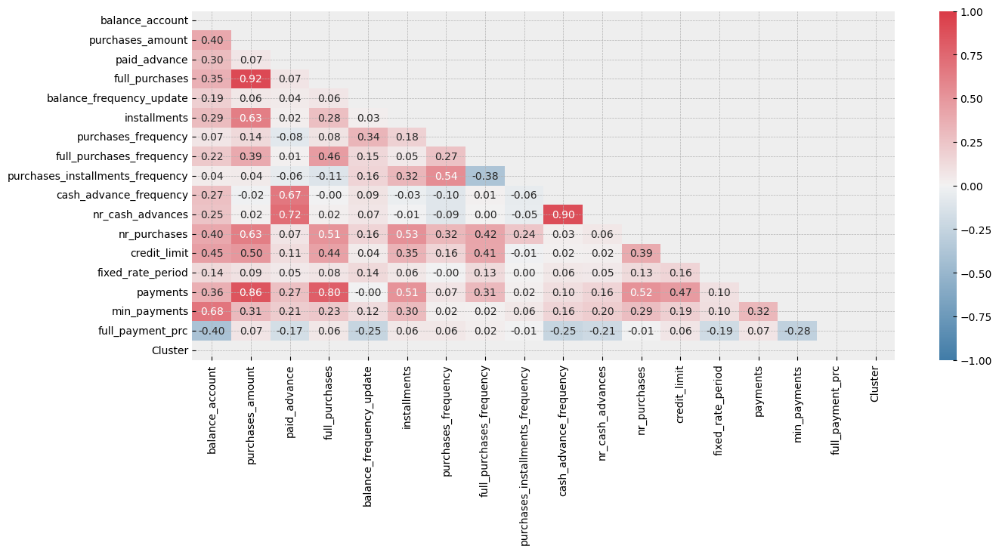

In [ ]:
plt.subplots(figsize=(15, 6))

correlation_matrix = df1.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle

colormap = sns.diverging_palette(240, 10, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask = mask,
    vmin = -1,
    vmax = 1,
    cmap = colormap,
    annot = True,
    fmt=".2f",
    );


I changed the following plots by cluster for combined ones above

In [ ]:
"""def get_nb_of_times(df, cluster_num):

    cluster_data = df[df['Cluster'] == cluster_num]

    nb_columns = ['paid_advance', 'nr_cash_advances','nr_purchases', 'purchases_amount', 'installments']

    means = cluster_data[nb_columns].mean()

    fig, ax = plt.subplots()
    bar_container = ax.bar(nb_columns, means)
    ax.set(ylabel='Nb of times', title=f"Cluster {cluster_num} number of times per action")
    ax.bar_label(bar_container, fmt='{:,.2f}')
    plt.xticks(rotation=75)


def get_amounts(df, cluster_num):

    cluster_data = df[df['Cluster'] == cluster_num]

    amount_columns = ['full_purchases', 'nr_cash_advances','nr_purchases', 'credit_limit','fixed_rate_period' ,'payments',
                    'min_payments', 'full_payment_prc']

    means = cluster_data[amount_columns].mean()

    fig, ax = plt.subplots()
    bar_container = ax.bar(amount_columns, means)
    ax.set(ylabel='Nb of times', title=f"Cluster {cluster_num} number of times per action")
    ax.bar_label(bar_container, fmt='{:,.2f}')
    plt.xticks(rotation=75)


def get_freqs(df, cluster_num):

    cluster_data = df[df['Cluster'] == cluster_num]

    freq_columns = ['purchases_frequency', 'full_purchases_frequency',
                    'purchases_installments_frequency', 'cash_advance_frequency']

    means = cluster_data[freq_columns].mean()


    fig, ax = plt.subplots()
    bar_container = ax.bar(freq_columns, means)
    ax.set(ylabel='Mean frequency', title=f"Cluster {cluster_num} mean frequencies")
    ax.bar_label(bar_container, fmt='{:,.2f}')
    plt.xticks(rotation=75)


get_freqs(df1, 1)

get_nb_of_times(df1, 1)
"""

'def get_nb_of_times(df, cluster_num):\n\n    cluster_data = df[df[\'Cluster\'] == cluster_num]\n\n    nb_columns = [\'paid_advance\', \'nr_cash_advances\',\'nr_purchases\', \'purchases_amount\', \'installments\']\n\n    means = cluster_data[nb_columns].mean()\n\n    fig, ax = plt.subplots()\n    bar_container = ax.bar(nb_columns, means)\n    ax.set(ylabel=\'Nb of times\', title=f"Cluster {cluster_num} number of times per action")\n    ax.bar_label(bar_container, fmt=\'{:,.2f}\')\n    plt.xticks(rotation=75)\n\n\ndef get_amounts(df, cluster_num):\n\n    cluster_data = df[df[\'Cluster\'] == cluster_num]\n\n    amount_columns = [\'full_purchases\', \'nr_cash_advances\',\'nr_purchases\', \'credit_limit\',\'fixed_rate_period\' ,\'payments\',\n                    \'min_payments\', \'full_payment_prc\']\n\n    means = cluster_data[amount_columns].mean()\n\n    fig, ax = plt.subplots()\n    bar_container = ax.bar(amount_columns, means)\n    ax.set(ylabel=\'Nb of times\', title=f"Cluster {clus

### Cluster 2

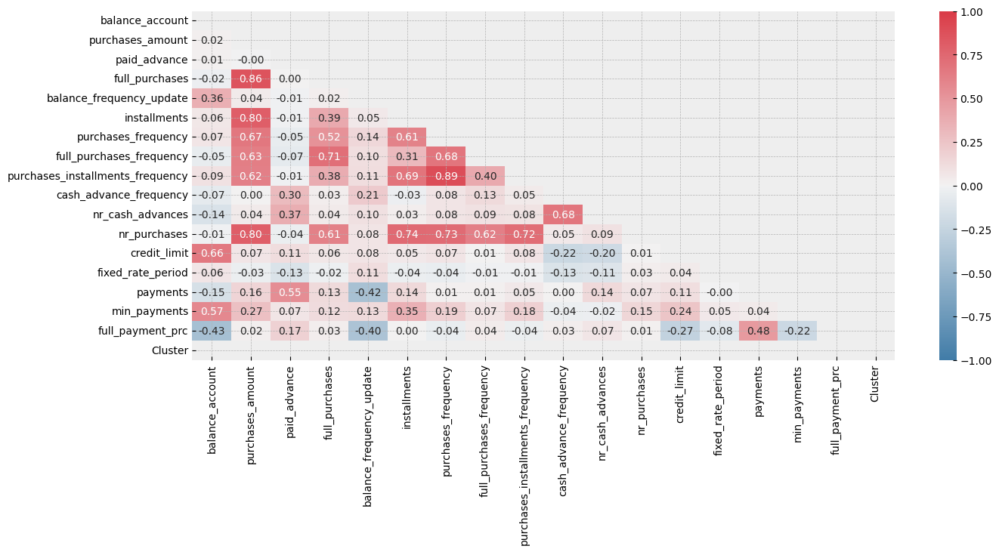

In [ ]:
plt.subplots(figsize=(15, 6))

correlation_matrix = df2.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle

colormap = sns.diverging_palette(240, 10, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask = mask,
    vmin = -1,
    vmax = 1,
    cmap = colormap,
    annot = True,
    fmt=".2f",
    );

### Cluster 3

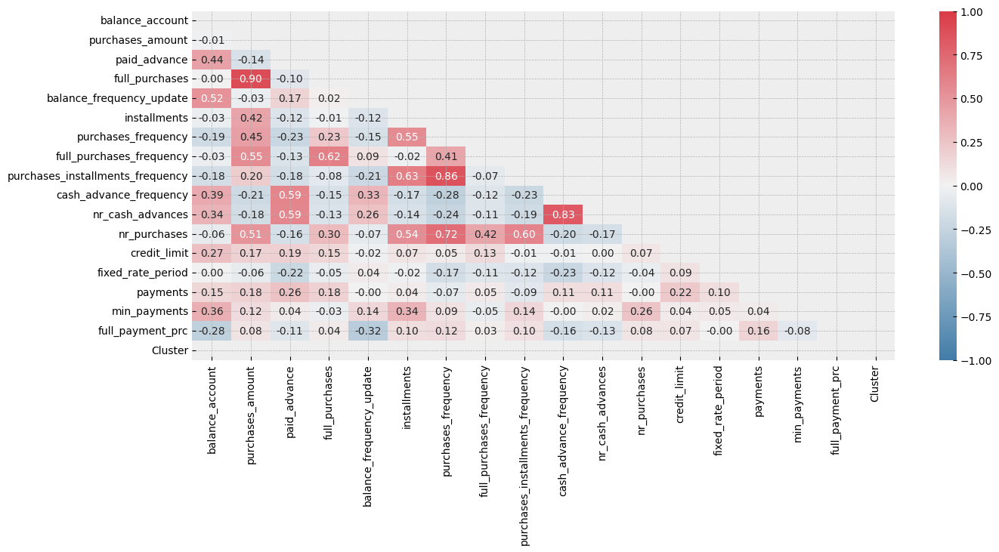

In [ ]:
plt.subplots(figsize=(15, 6))

correlation_matrix = df3.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle

colormap = sns.diverging_palette(240, 10, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask = mask,
    vmin = -1,
    vmax = 1,
    cmap = colormap,
    annot = True,
    fmt=".2f",
    );

## PCA

In [ ]:
from sklearn.decomposition import PCA as sklearnPCA

In [ ]:
pca = sklearnPCA() # we only have 17 features, so let's try keeping them all
Y_sklearn = pca.fit_transform(data_clean)
Y_sklearn

array([[ 2.44512782e-01, -2.14258458e+00, -1.38129314e+00, ...,
        -6.88486836e-02,  1.03745959e-01,  1.20861374e-04],
       [-7.67362303e-01, -1.69767564e+00, -8.75820314e-01, ...,
        -5.51926188e-01,  2.70830696e-01,  2.04229916e-04],
       [-2.19430116e+00,  4.30228408e-01,  1.56477368e-01, ...,
        -2.13382388e-02, -9.23204509e-02,  7.72013713e-05],
       ...,
       [-2.64815073e+00, -9.58079811e-01,  2.38838195e+00, ...,
         5.44379647e-02, -1.51219548e-01,  1.09046086e-04],
       [ 8.39252762e-01, -1.86153394e-01, -1.62995313e-01, ...,
         2.40841625e-01,  4.21159758e-01,  1.06035632e-04],
       [ 1.80099077e+00, -9.58262309e-01, -6.91180526e-01, ...,
        -1.15987356e-01, -1.33965302e-01, -5.37939452e-05]])

In [ ]:
variance_percentage = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(variance_percentage)

#print(variance_percentage)
cumulative_variance

array([0.28167804, 0.47663115, 0.57037113, 0.64223502, 0.70167261,
       0.75708921, 0.80344921, 0.84439573, 0.88032252, 0.91090492,
       0.93337666, 0.95033326, 0.96554476, 0.97711579, 0.98787079,
       0.99750858, 0.99999932, 1.        ])

In [ ]:
num_components_95 = np.where(cumulative_variance >= 0.95)[0][0] + 1
num_components_95

12

12 principal components explain 95% of the total variance**

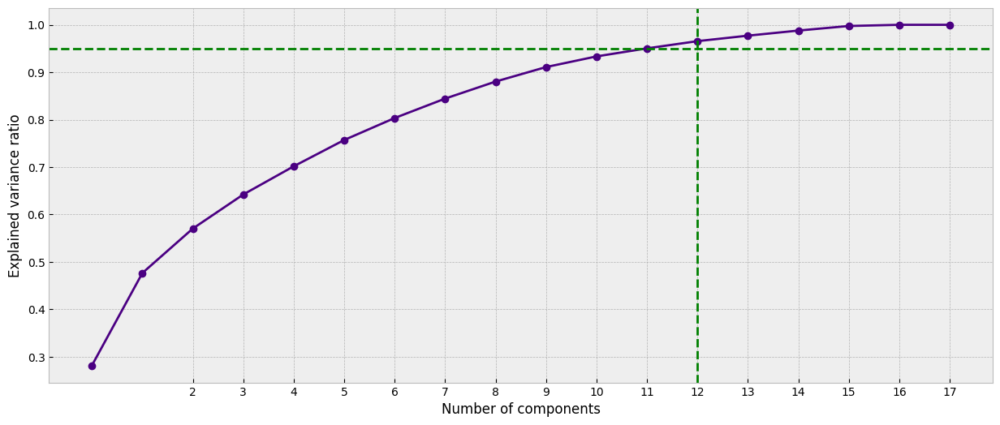

In [ ]:
plt.subplots(figsize=(15, 6))
plt.style.use('bmh')

plt.plot(cumulative_variance, '-o', color="indigo")
plt.xlabel("Number of components")
plt.ylabel("Explained variance ratio")
plt.axvline(x=num_components_95, color="green", linestyle = '--')
plt.axhline(y=0.95, color="green", linestyle = '--')
plt.xticks(range(2, 18, 1))

plt.show()

## Getting loading scores from PCA

In [ ]:
loadings = pd.DataFrame(
    pca.components_,
    columns=data_clean.columns,
    index=[f"PC{i+1}" for i in range(pca.n_components_)]
)

loadings

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
PC1,0.076877,0.375745,-0.041159,0.310651,0.125792,0.319588,0.338240,0.281368,0.292668,-0.103770,-0.062401,0.370146,0.183745,0.081094,0.231622,0.046092,0.141189,-0.299669
PC2,0.407790,0.084658,0.429467,0.101913,0.131379,0.013351,-0.171732,0.006818,-0.163279,0.420077,0.406761,0.017013,0.260154,0.001635,0.279972,0.172818,-0.178657,0.089527
PC3,-0.117970,0.317745,-0.106087,0.408958,-0.388204,0.001869,-0.335377,0.100044,-0.399736,-0.172939,-0.186910,0.010318,0.099188,-0.038083,0.258049,-0.102843,0.055090,0.342345
PC4,-0.303791,-0.007018,0.258848,-0.008929,-0.234622,-0.000199,0.108601,-0.003423,0.105960,0.242368,0.305335,-0.021142,-0.107576,-0.426441,0.163656,-0.428661,0.444508,-0.092383
PC5,-0.055494,-0.048406,-0.065368,0.169036,0.386003,-0.424989,0.029702,0.542449,-0.267486,0.090894,0.054166,-0.038796,0.015094,0.167094,-0.130999,-0.433154,-0.054131,-0.129896
PC6,-0.021604,-0.151385,0.160552,-0.169154,-0.186833,-0.047998,-0.039220,-0.129327,0.012685,-0.116438,0.010395,-0.148367,0.334914,0.713894,0.189600,-0.150616,0.366858,-0.126022
PC7,0.266834,-0.183546,0.045541,-0.107587,-0.137002,-0.237328,0.123400,0.249116,-0.052822,-0.159893,-0.222183,-0.119557,0.551064,-0.434260,-0.140242,0.222855,0.271777,-0.040226
PC8,-0.140402,0.039813,-0.023650,0.135637,0.307973,-0.154765,-0.076807,0.033750,-0.173088,0.022688,0.061381,-0.125148,-0.338927,0.051129,0.105307,0.579995,0.563742,-0.035056
PC9,0.131438,0.102108,-0.041848,0.015872,0.594081,0.212737,-0.210484,-0.410586,-0.053074,-0.091216,-0.262776,-0.206395,0.176719,-0.208843,0.099943,-0.344704,0.179628,-0.022643
PC10,-0.012826,-0.014511,0.314733,0.216215,-0.024719,-0.431290,0.180035,-0.148391,0.181679,-0.261585,-0.211808,-0.285349,-0.177827,-0.082131,0.445681,0.031881,-0.315513,-0.217899


In [ ]:
loadings_transposed = loadings.T
loadings_transposed


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
balance_account,0.076877,0.407790,-0.117970,-0.303791,-0.055494,-0.021604,0.266834,-0.140402,0.131438,-0.012826,0.158752,0.428762,-0.485076,-0.162290,0.274084,-0.252758,0.002563,-0.000043
purchases_amount,0.375745,0.084658,0.317745,-0.007018,-0.048406,-0.151385,-0.183546,0.039813,0.102108,-0.014511,0.209312,-0.087249,-0.094187,0.230461,0.048026,0.040741,0.002617,0.749724
paid_advance,-0.041159,0.429467,-0.106087,0.258848,-0.065368,0.160552,0.045541,-0.023650,-0.041848,0.314733,-0.391411,0.183037,0.008157,0.616998,0.070592,0.172247,-0.002416,-0.000021
full_purchases,0.310651,0.101913,0.408958,-0.008929,0.169036,-0.169154,-0.107587,0.135637,0.015872,0.216215,0.438051,0.065658,0.027873,0.232917,0.003331,0.051596,-0.005077,-0.581118
balance_frequency_update,0.125792,0.131379,-0.388204,-0.234622,0.386003,-0.186833,-0.137002,0.307973,0.594081,-0.024719,-0.147621,-0.045472,0.282960,0.039285,0.041756,-0.053722,0.001139,-0.000002
installments,0.319588,0.013351,0.001869,-0.000199,-0.424989,-0.047998,-0.237328,-0.154765,0.212737,-0.431290,-0.308401,-0.327084,-0.274053,0.118165,0.107537,0.001818,0.016470,-0.316569
purchases_frequency,0.338240,-0.171732,-0.335377,0.108601,0.029702,-0.039220,0.123400,-0.076807,-0.210484,0.180035,0.086698,-0.130917,0.063109,-0.002177,0.329154,-0.020301,0.702971,0.000188
full_purchases_frequency,0.281368,0.006818,0.100044,-0.003423,0.542449,-0.129327,0.249116,0.033750,-0.410586,-0.148391,-0.360607,-0.181028,-0.133480,-0.043161,0.235323,-0.013632,-0.328539,-0.000145
purchases_installments_frequency,0.292668,-0.163279,-0.399736,0.105960,-0.267486,0.012685,-0.052822,-0.173088,-0.053074,0.181679,0.239829,0.075019,0.257818,-0.025480,0.267760,0.029628,-0.611185,-0.000173
cash_advance_frequency,-0.103770,0.420077,-0.172939,0.242368,0.090894,-0.116438,-0.159893,0.022688,-0.091216,-0.261585,0.231848,-0.040039,-0.051290,-0.288462,0.090476,0.669856,0.037135,0.000017


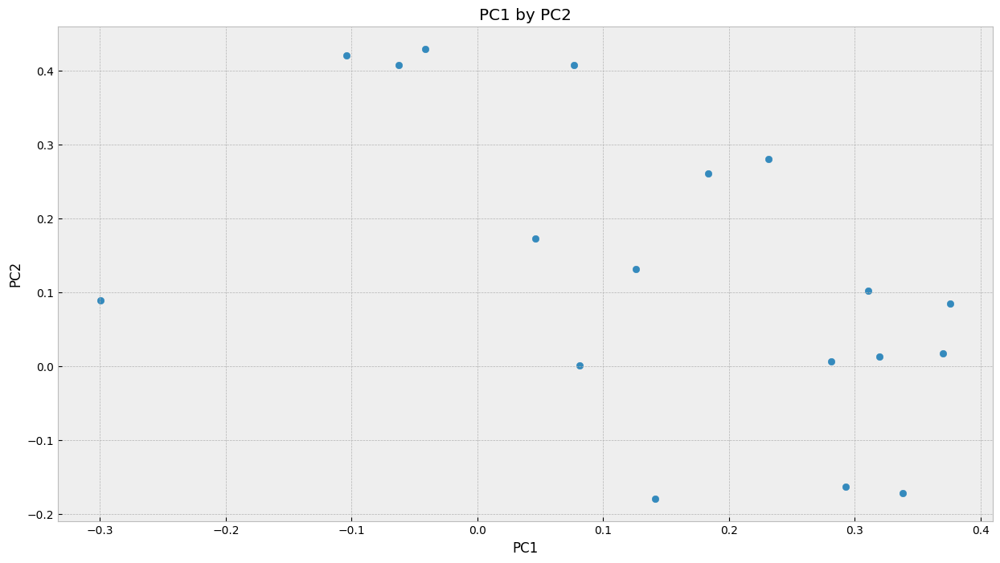

In [ ]:
plt.figure(figsize=(15, 8))
plt.style.use('bmh')

plt.scatter(loadings_transposed['PC1'], loadings_transposed['PC2'])

plt.title('PC1 by PC2')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.show()

No clear grouping of data based on just PC1 and PC2

## t-SNE

Following functions from the notebook: ML_D7_E2_Gene_Expressions_RNAseq

In [ ]:
from sklearn.manifold import TSNE


In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=1000)
# reduce to 2D
# verbose = get update while running
# perplexity = set under 30 for smaller dataset
# iter = more to finetune but too high may cause overfitting (don't go over 1000)

In [ ]:
#we fit and transform high dimensional dataset to the tsne object defined above

X_tsne = tsne.fit_transform(data_clean)
X_tsne

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8500 samples in 0.002s...
[t-SNE] Computed neighbors for 8500 samples in 0.807s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8500
[t-SNE] Computed conditional probabilities for sample 2000 / 8500
[t-SNE] Computed conditional probabilities for sample 3000 / 8500
[t-SNE] Computed conditional probabilities for sample 4000 / 8500
[t-SNE] Computed conditional probabilities for sample 5000 / 8500
[t-SNE] Computed conditional probabilities for sample 6000 / 8500
[t-SNE] Computed conditional probabilities for sample 7000 / 8500
[t-SNE] Computed conditional probabilities for sample 8000 / 8500
[t-SNE] Computed conditional probabilities for sample 8500 / 8500
[t-SNE] Mean sigma: 0.436269
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.629791
[t-SNE] KL divergence after 1000 iterations: 1.337675


array([[ 34.441936 , -55.54783  ],
       [ -2.334352 , -64.769936 ],
       [-18.117197 ,  51.991817 ],
       ...,
       [-26.30643  , -49.4719   ],
       [ 59.257797 ,  27.208828 ],
       [ 50.300793 ,   5.5944567]], dtype=float32)

In [ ]:
data_clean['Cluster'].value_counts()

,count
Cluster,
3,4275
1,3474
2,751


original data shape: (8500, 18)
embedded data shape: (8500, 2)


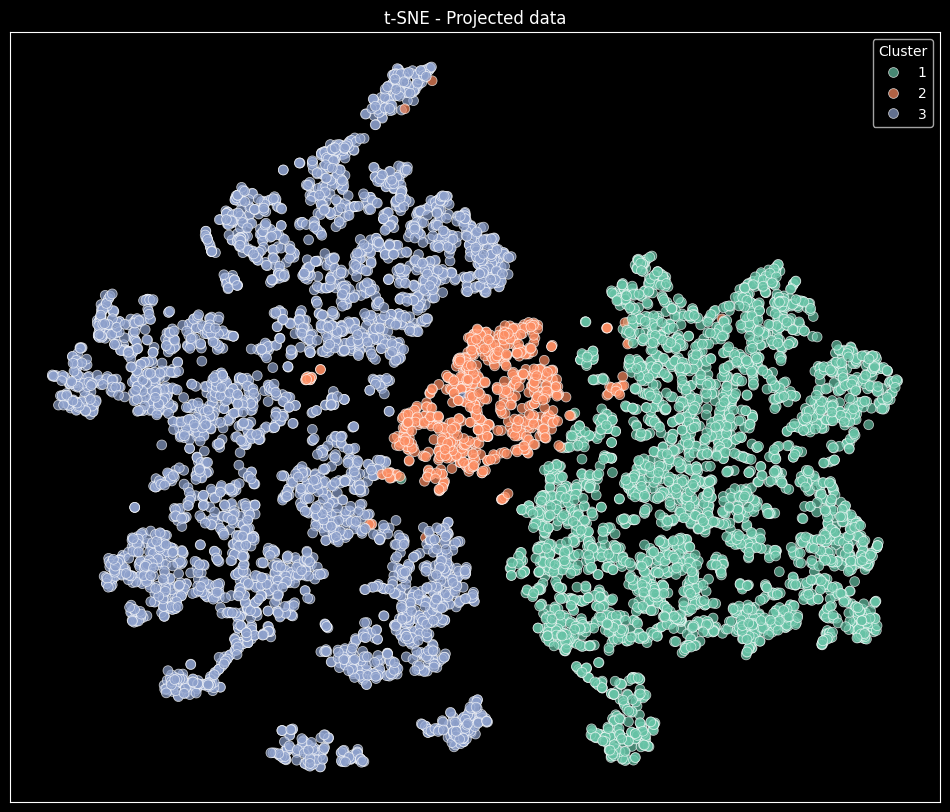

In [ ]:
#X_tsne is the embedding of the training data in low-dimensional space (2 dimensions)

print('original data shape:', data_clean.shape)
print('embedded data shape:', X_tsne.shape)

# Plot Result of t-SNE:

fig = plt.figure(figsize =(12, 10))
plt.style.use('default')
plt.style.use("dark_background")

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
#ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=data_w_clust['Cluster'], palette="Set2", s=50, alpha=0.7)


plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

In [ ]:
data_clean['Cluster'].value_counts()

,count
Cluster,
3,4275
1,3474
2,751


Cluster 1:
- generally make more purchases and prefer to buy in installments. "frequent buyers" who spread their payments over time with installments. They likely represent a larger portion of the customer base in terms of purchase activity but don't use methods like "Cash in Advance" as frequently.

Cluster 2:
- tend to make larger or more expensive purchases, often using the "Cash in Advance" method. This might indicate that these customers are higher spenders who need upfront payment flexibility.
- Despite having different purchasing habits (more expensive items, more "Cash in Advance"), they are closer to Cluster 1 in terms of buying behavior compared to Cluster 3.

Cluster 3:
- more casual users, don’t purchase frequently or in large amounts. This cluster likely represents less active customers who may only make occasional purchases don't use installment or Cash in Advance that frequently.

# 2 Clusters

## Extracting and adding to dataframe

In [ ]:
num_clusters = 2
clusters2 = fcluster(linkage_matrix, num_clusters, criterion='maxclust') # maximize the number of clusters so that the final number of clusters is equal to num_clusters.
data_2_clusters = data.copy()
data_2_clusters['Cluster'] = clusters2
data_2_clusters.tail(10)

,customer_id,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
8490,qiNQQyNu3YM9PRwP,0.000000,232.20,0.000000,0.00,0.000000,232.20,1.000000,0.000000,1.000000,0.000000,0,12,1500.0,12,415.603589,NaN,0.000000,2
8491,tN3pEIcj04loWHyP,1748.310383,0.00,157.152652,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.083333,1,0,2000.0,12,538.443435,484.325120,0.000000,2
8492,By5N2Lqz6aZkh22M,1514.885982,928.06,0.000000,834.30,0.909091,93.76,0.909091,0.727273,0.818182,0.000000,0,31,4500.0,11,2797.891300,469.817435,0.000000,1
8493,s2H9hSAyGhSsC8Cp,3.786310,133.05,0.000000,28.20,0.636364,104.85,0.416667,0.166667,0.250000,0.000000,0,5,12000.0,12,210.053432,99.533735,0.444444,2
8494,UCyeExThOQm4BVuM,2707.058356,2018.13,0.000000,1545.23,1.000000,472.90,0.750000,0.250000,0.666667,0.000000,0,26,7000.0,12,2575.541309,661.487315,0.000000,1
8495,zdVfd3CYHYBjf61b,1127.607606,0.00,271.093275,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.083333,1,0,8500.0,12,662.387331,260.277533,0.000000,2
8496,JGghMowcxhfbVGKm,21.409828,149.71,0.000000,0.00,1.000000,149.71,0.916667,0.000000,0.916667,0.000000,0,11,1500.0,12,141.974905,150.500248,0.166667,1
8497,5GrEtC6ncxuLpnXZ,0.000000,0.00,253.887233,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.111111,1,0,500.0,9,2437.932505,NaN,0.000000,2
8498,Ox7ETtYHjE2uo4Xo,1646.384530,1047.34,146.650389,1047.34,1.000000,0.00,0.583333,0.583333,0.000000,0.166667,2,51,3000.0,12,462.848132,497.408854,0.000000,1
8499,QIwf3M4Yn4EHwAyv,1861.087370,1752.06,0.000000,1417.18,1.000000,334.88,0.916667,0.583333,0.666667,0.000000,0,32,3500.0,12,737.941555,437.075647,0.000000,1


In [ ]:
data_2_clusters = data_2_clusters.drop(columns='customer_id')
data_2_clusters['Cluster'].value_counts()

,count
Cluster,
2,5026
1,3474


In [ ]:
df1_2clust = data_2_clusters[data_w_clust['Cluster'] == 1]
df2_2clust = data_2_clusters[data_w_clust['Cluster'] == 2]

df1_2clust.head()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
0,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571,1
3,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000,1
14,3516.835582,4019.73,0.000000,1932.75,1.000000,2086.98,0.916667,0.916667,1.000000,0.000000,0,73,12000.0,12,3376.573790,910.942173,0.000000,1
15,179.882212,828.00,0.000000,0.00,1.000000,828.00,1.000000,0.000000,1.000000,0.000000,0,12,1000.0,12,649.951462,152.775223,0.300000,1
16,2739.711796,847.66,1201.188255,765.80,1.000000,81.86,1.000000,1.000000,0.583333,0.083333,1,20,7500.0,12,3273.326636,718.558976,0.000000,1


## Plots

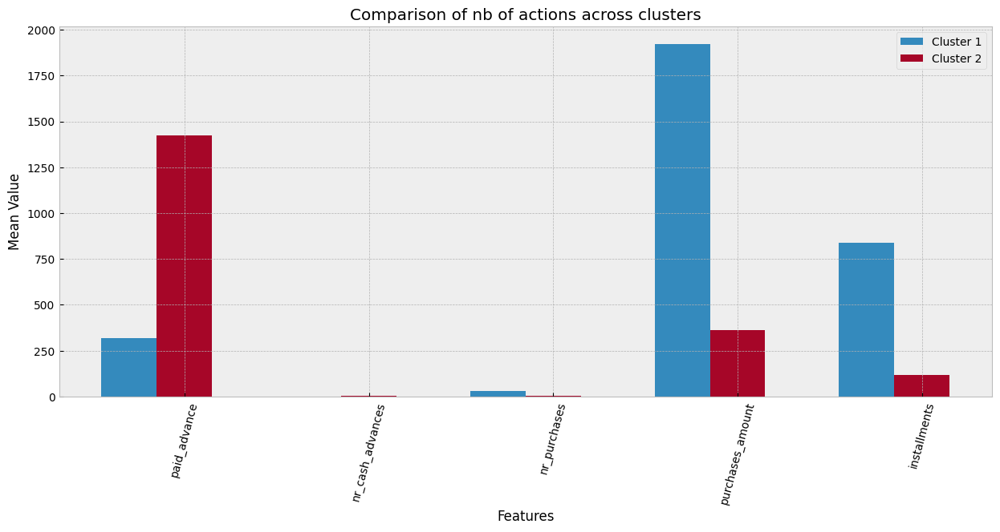

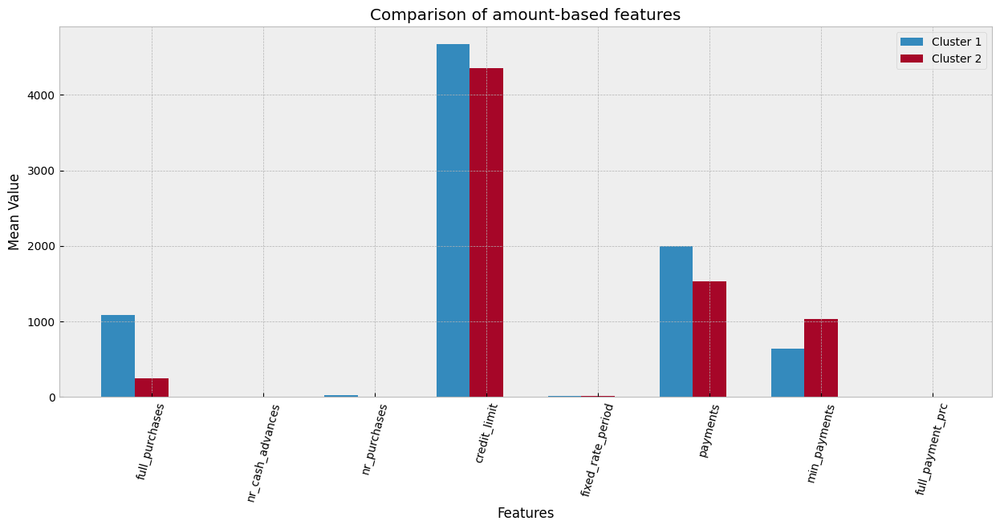

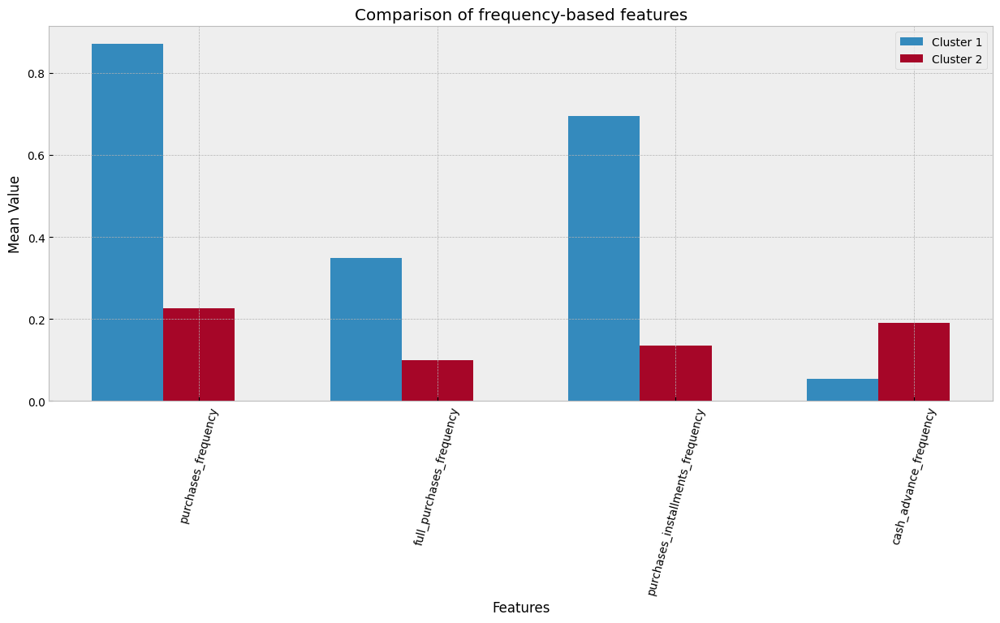

In [ ]:
plt.style.use('default')
cluster_comp_plot(data_2_clusters)

### Some observations:
Cluster 2 uses Cash in Advance much more, suggesting that these customers prefer to withdraw cash rather than making direct purchases. This is the typical behavior that defines this group or users.

Cluster 1 tends to make larger purchases, often paying in full, indicating a preference for high-value transactions. They also have a higher credit limit and make purchases more frequently, suggesting they are more active users.

## Correlation matrices


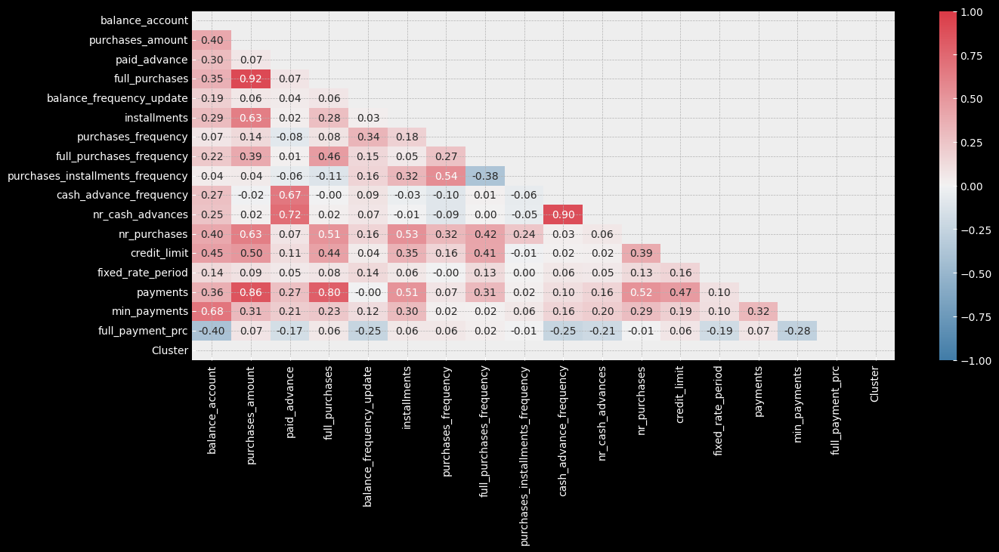

In [ ]:
plt.subplots(figsize=(15, 6))

correlation_matrix = df1_2clust.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle

colormap = sns.diverging_palette(240, 10, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask = mask,
    vmin = -1,
    vmax = 1,
    cmap = colormap,
    annot = True,
    fmt=".2f",
    );


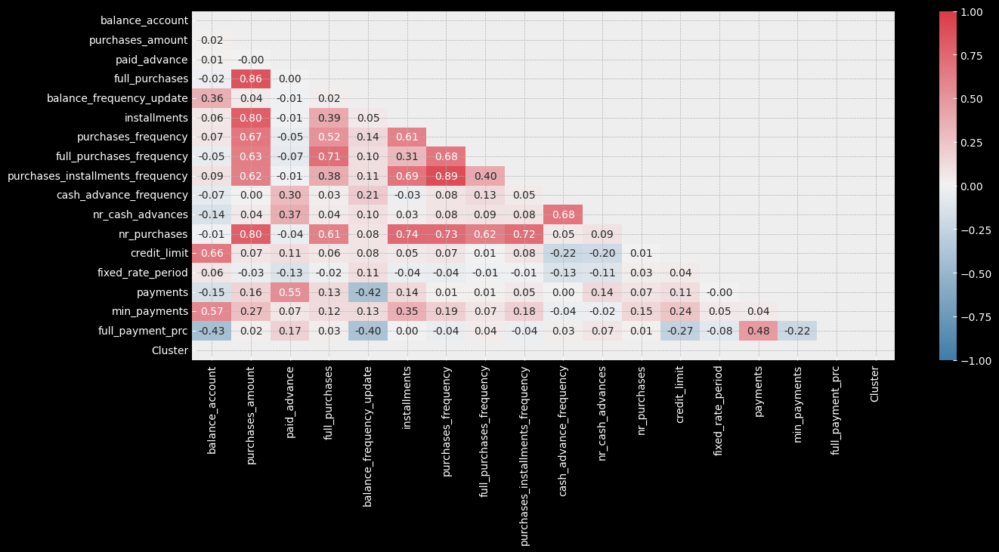

In [ ]:
plt.subplots(figsize=(15, 6))

correlation_matrix = df2_2clust.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle

colormap = sns.diverging_palette(240, 10, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask = mask,
    vmin = -1,
    vmax = 1,
    cmap = colormap,
    annot = True,
    fmt=".2f",
    );


## t-SNE


In [ ]:
data_clean_2_clust = data_clean.copy()
data_clean_2_clust['Cluster2'] = clusters2
data_clean_2_clust = data_clean_2_clust.drop(columns ='Cluster')
data_clean_2_clust.tail(10)

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster2
8490,-0.749114,-0.356239,-0.468389,-0.352328,-3.689515,-0.197243,1.273196,-0.678245,1.601969,-0.673477,-0.474675,-0.107082,-0.822641,0.361364,-0.451308,-0.352307,-0.523476,2
8491,0.087242,-0.464035,-0.392778,-0.352328,0.520953,-0.452383,-1.220250,-0.678245,-0.916043,-0.258637,-0.328785,-0.587080,-0.684884,0.361364,-0.408847,-0.159584,-0.523476,2
8492,-0.024424,-0.033194,-0.468389,0.147442,0.138183,-0.349360,1.046519,1.764411,1.144149,-0.673477,-0.474675,0.652915,0.003899,-0.385438,0.372150,-0.165656,-0.523476,1
8493,-0.747303,-0.402268,-0.468389,-0.335436,-1.010125,-0.337174,-0.181314,-0.118469,-0.286540,-0.673477,-0.474675,-0.387081,2.070248,0.361364,-0.522358,-0.320641,1.001265,2
8494,0.545887,0.472859,-0.468389,0.573310,0.520953,0.067237,0.649834,0.161418,0.762633,-0.673477,-0.474675,0.452916,0.692682,0.361364,0.295293,-0.085431,-0.523476,1
8495,-0.209690,-0.464035,-0.337957,-0.352328,0.520953,-0.452383,-1.220250,-0.678245,-0.916043,-0.258637,-0.328785,-0.587080,1.105952,0.361364,-0.366005,-0.253361,-0.523476,2
8496,-0.738872,-0.394534,-0.468389,-0.352328,0.520953,-0.287882,1.065410,-0.678245,1.392136,-0.673477,-0.474675,-0.147082,-0.822641,0.361364,-0.545890,-0.299309,0.048304,1
8497,-0.749114,-0.464035,-0.346235,-0.352328,-3.689515,-0.452383,-1.220250,-0.678245,-0.916043,-0.120355,-0.328785,-0.587080,-1.098154,-1.879043,0.247727,-0.317188,-0.523476,2
8498,0.038482,0.022181,-0.397831,0.275059,0.520953,-0.452383,0.234259,1.280967,-0.916043,0.156208,-0.182895,1.452912,-0.409371,0.361364,-0.434977,-0.154107,-0.523476,1
8499,0.141192,0.349339,-0.468389,0.496604,0.520953,-0.084419,1.065410,1.280967,0.762633,-0.673477,-0.474675,0.692915,-0.271614,0.361364,-0.339889,-0.179360,-0.523476,1


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8500 samples in 0.001s...
[t-SNE] Computed neighbors for 8500 samples in 0.703s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8500
[t-SNE] Computed conditional probabilities for sample 2000 / 8500
[t-SNE] Computed conditional probabilities for sample 3000 / 8500
[t-SNE] Computed conditional probabilities for sample 4000 / 8500
[t-SNE] Computed conditional probabilities for sample 5000 / 8500
[t-SNE] Computed conditional probabilities for sample 6000 / 8500
[t-SNE] Computed conditional probabilities for sample 7000 / 8500
[t-SNE] Computed conditional probabilities for sample 8000 / 8500
[t-SNE] Computed conditional probabilities for sample 8500 / 8500
[t-SNE] Mean sigma: 0.435094
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.700600
[t-SNE] KL divergence after 1000 iterations: 1.391205


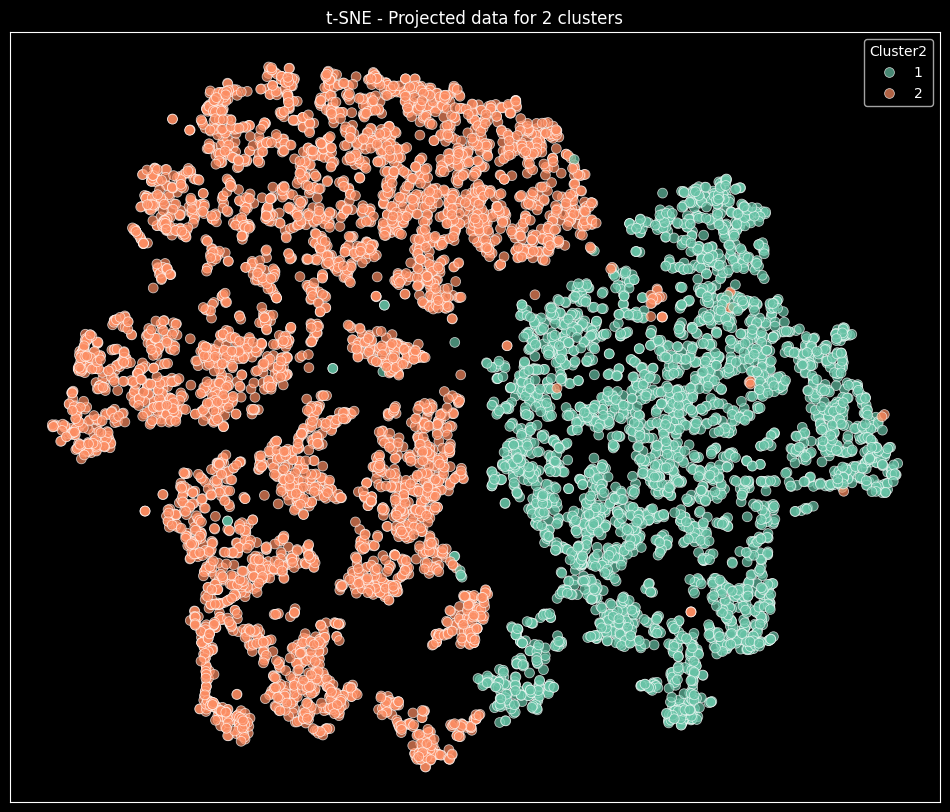

In [ ]:
X_tsne = tsne.fit_transform(data_clean_2_clust)

fig = plt.figure(figsize =(12, 10))
plt.style.use('default')
plt.style.use("dark_background")

ax = fig.add_subplot()

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=data_clean_2_clust['Cluster2'], palette="Set2", s=50, alpha=0.7)


plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data for 2 clusters')
plt.show()

- KL divergence (e.g., >10) --> may indicate that the clusters are not well-separated or that t-SNE struggled to optimize the embedding.
- low KL divergence (close to 0) --> embedding is very close to the original distribution, which is the case here.

# Extra stuff with 3 clusters




## Pair plots

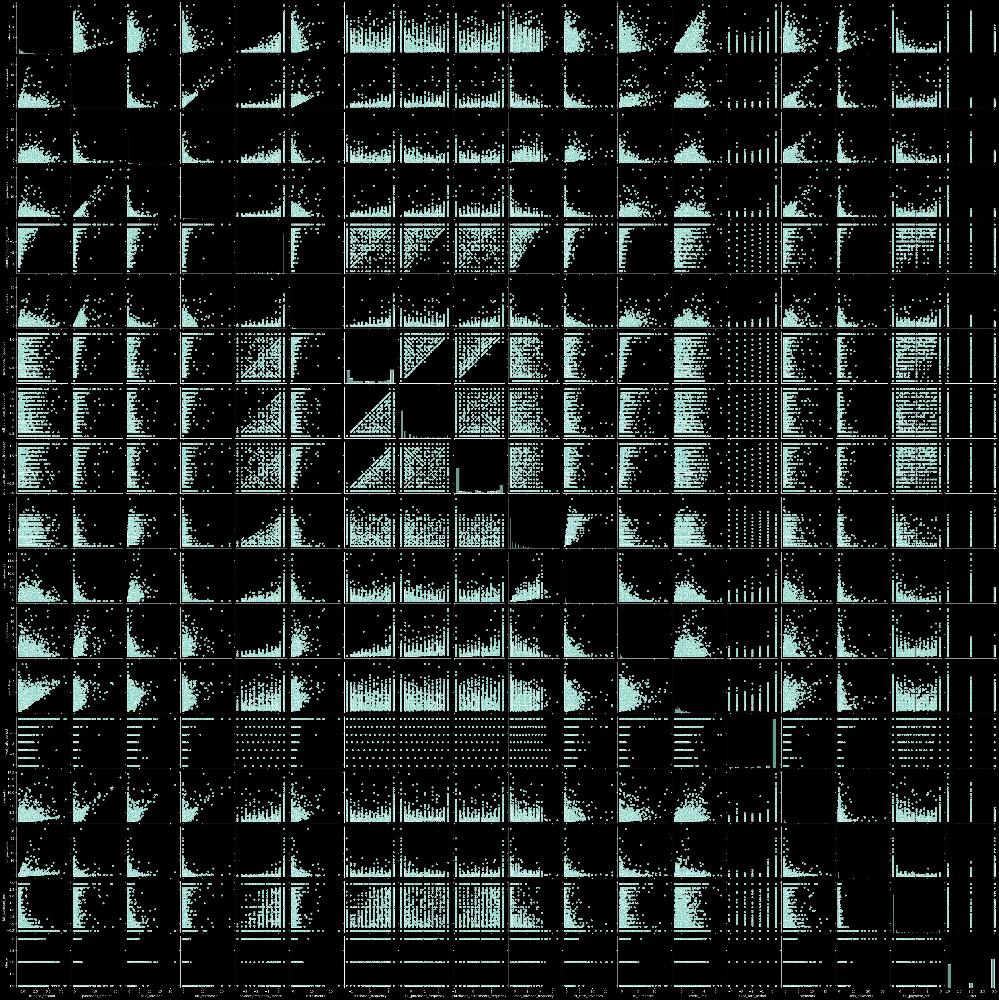

In [ ]:
sns.pairplot(data_clean)

## Multivariate anomaly detection

Because I'm lazy and I think there are a lot of features that could play a part in this.


Features that may show risky behavior:

Spending:
- purchases_amount
- installments
- full_purchases, payments
- min_payments
- full_payment_prc

Cash in advance:
- nr_cash_advances
- paid_advance
- cash_advance_frequency

Purchase frequency:
- purchases_frequency
- full_purchases_frequency
- purchases_installments_frequency

Credit & balance:
- credit_limit
- balance_account
- balance_frequency_update

In [ ]:
from sklearn.ensemble import IsolationForest # not using pyod because I don't want to install it for now and this seemed easier to work with

In [ ]:
features = [
    'purchases_amount', 'installments', 'full_purchases', 'payments', 'min_payments', 'full_payment_prc',
    'nr_cash_advances', 'paid_advance', 'cash_advance_frequency',
    'purchases_frequency', 'full_purchases_frequency', 'purchases_installments_frequency',
    'credit_limit', 'balance_account', 'balance_frequency_update'
]

iso_forest = IsolationForest(contamination=0.01, random_state=42) # I don't think we have that much data so I want to look at the 1% of risky customers only
data_clean_ano = data_clean.copy() # working on a copy just in case to avoid breaking anything
data_clean_ano['anomaly'] = iso_forest.fit_predict(data_clean_ano)

data_clean_ano['anomaly'].value_counts()

,count
anomaly,
1,8415
-1,85


In [ ]:
data_clean_ano.head()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster,anomaly
0,-0.744666,-0.414083,-0.468389,-0.352328,0.138183,-0.334153,1.046519,-0.678245,1.144149,-0.673477,-0.474675,-0.187082,-0.960397,-0.385438,-0.563901,-0.324752,0.946810,1,1
1,-0.723920,-0.394260,-0.468389,-0.352328,0.520953,-0.287234,1.273196,-0.678245,1.182300,-0.673477,-0.474675,-0.347081,-0.960397,-4.119450,-0.576049,-0.327580,-0.523476,3,1
2,-0.098138,-0.464035,-0.245690,-0.352328,0.520953,-0.452383,-1.220250,-0.678245,-0.916043,0.684186,0.400665,-0.587080,-0.822641,-0.385438,-0.490219,-0.176554,-0.523476,3,1
3,0.217997,-0.295433,-0.468389,-0.134773,0.520953,-0.452383,1.273196,2.680406,-0.916043,-0.673477,-0.474675,-0.067082,-0.684884,0.361364,-0.351538,-0.029188,-0.523476,1,1
4,-0.738436,-0.419933,0.090712,-0.295420,-2.158437,-0.452383,-1.012464,-0.398359,-0.916043,0.156208,-0.037005,-0.547080,-0.547127,0.361364,0.820251,-0.345500,-0.523476,3,1


In [ ]:
anomalies_df = pd.DataFrame(data_clean_ano.groupby('Cluster')['anomaly'].value_counts())
anomalies_df['Percentage'] = anomalies_df['count'].apply(lambda x: (x * 100) / 8500)
anomalies_df

count  Percentage
Cluster anomaly                   
1        1        3426   40.305882
        -1          48    0.564706
2        1         716    8.423529
        -1          35    0.411765
3        1        4273   50.270588
        -1           2    0.023529

### Some observations:

- In cluster 1 there are 48 credit card users that show risky behavior based on the features identified above (0.56% of the dataset).
- In cluster 2 there are 35 credit card users that show risky behavior(0.41% of the dataset)
- In cluster 3 which is more than half of the dataset and likely to represent the majority in the population, there are only 2 users that show risky behavior (0.02% of the dataset)

So if the company wants to keep an eye on customer at risk of not using their credit card properly we should focus more on clusters 1 and 2, i.e. those who buy more expensive stuff in full payments and those who use the cash in advance method frequently.

In [ ]:
anomalies = data_clean_ano[data_clean_ano['anomaly'] == -1]
anomalies

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster,anomaly
75,2.440931,2.133897,0.874131,1.373421,0.520953,2.531062,1.273196,1.280967,1.601969,0.156208,1.567785,3.812904,3.172300,0.361364,5.305065,2.437003,-0.237588,1,-1
100,3.319445,2.657629,0.343093,2.103739,0.520953,2.431050,1.273196,2.400520,1.601969,1.815574,0.984225,2.812907,3.447814,0.361364,0.057900,0.544901,-0.523476,2,-1
252,3.451934,4.955788,-0.468389,5.279120,0.520953,2.045923,1.273196,2.680406,1.392136,-0.673477,-0.474675,3.132906,3.172300,0.361364,2.992056,0.630926,-0.523476,1,-1
464,0.715764,0.582350,1.533662,0.199102,0.099906,1.012793,1.023851,2.008676,1.098367,3.309004,3.902025,2.132910,1.243708,-1.132240,-0.203597,0.039569,-0.523476,2,-1
547,-0.282244,4.281114,0.311380,3.925566,0.520953,2.931869,1.273196,2.680406,1.182300,2.230414,2.151345,4.612901,1.656978,0.361364,3.101331,-0.216794,2.049527,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7657,3.916576,4.271031,-0.413963,2.394484,0.520953,5.716454,1.273196,2.400520,1.601969,0.156208,-0.182895,4.652901,2.896787,0.361364,2.271459,0.599110,-0.523476,1,-1
7812,-0.620394,1.658614,0.944212,1.281446,0.520953,1.574837,1.065410,1.280967,0.972466,3.060099,5.360925,0.932914,-0.133858,0.361364,1.670847,-0.291055,1.534926,2,-1
8005,3.661801,0.195328,4.254813,0.113513,0.520953,0.253757,1.273196,0.161418,1.601969,3.474939,3.756135,2.492909,2.208004,0.361364,0.876631,1.603280,-0.523476,2,-1
8014,3.471764,1.262470,13.620271,1.021353,0.520953,1.114299,1.273196,1.840744,1.601969,1.400734,3.318465,1.852911,3.034544,0.361364,9.135654,2.702233,-0.237588,2,-1


### Adding anomalies to data not standardized

In [ ]:
data_no_stand_w_ano = pd.merge(data_w_clust, data_clean_ano['anomaly'], how = 'inner', left_index=True, right_index=True)

data_no_stand_w_ano.head()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster,anomaly
0,9.298409,107.60,0.000000,0.00,0.909091,107.6,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571,1,1
1,52.666422,150.30,0.000000,0.00,1.000000,150.3,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000,3,1
2,1360.795674,0.00,462.861443,0.00,1.000000,0.0,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000,3,1
3,2021.641161,363.18,0.000000,363.18,1.000000,0.0,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000,1,1
4,22.322374,95.00,1162.045833,95.00,0.363636,0.0,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000,3,1


We could provide the customerID for these people if the business required it so that they can put an alert on suspicious behavior like taking out a lot of cash at once

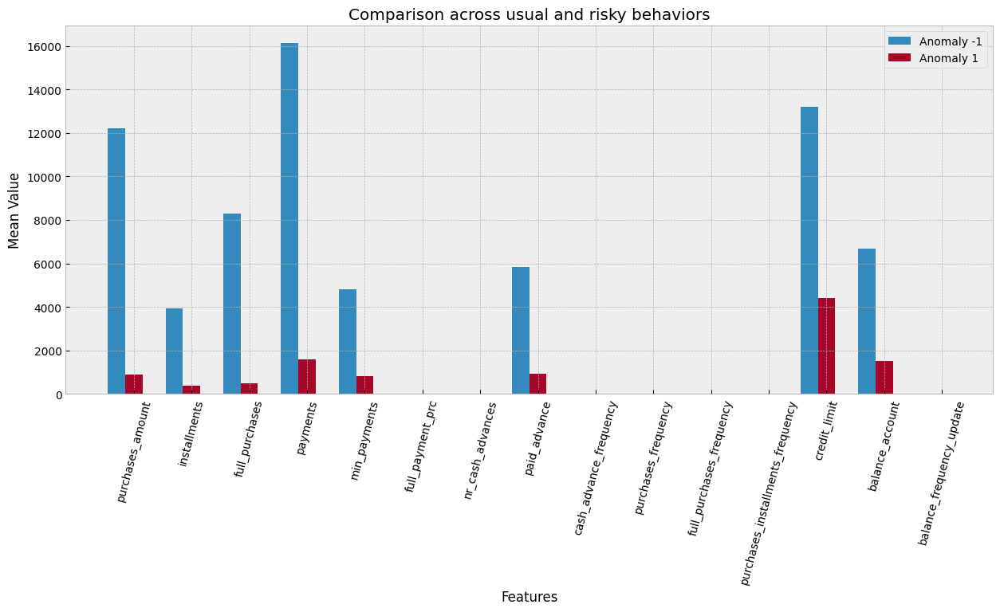

In [ ]:
def anomaly_comp_plot(df):

    features = [
      'purchases_amount', 'installments', 'full_purchases', 'payments', 'min_payments', 'full_payment_prc',
      'nr_cash_advances', 'paid_advance', 'cash_advance_frequency',
      'purchases_frequency', 'full_purchases_frequency', 'purchases_installments_frequency',
      'credit_limit', 'balance_account', 'balance_frequency_update'
      ]

    # group by whether ano and calculate mean
    ano_summary = df.groupby('anomaly').mean()

    # plot each category
    def plot_ano_comparison(features, title):
        plt.figure(figsize=(15, 6))
        plt.style.use('bmh')
        x = np.arange(len(features))
        width = 0.3

        for i, ano in enumerate(ano_summary.index):
            plt.bar(x + (i * width), ano_summary.loc[ano, features], width=width, label=f'Anomaly {ano}')

        plt.xlabel("Features")
        plt.ylabel("Mean Value")
        plt.title(title)
        plt.xticks(ticks=x + width, labels=features, rotation=75)
        plt.legend()
        plt.show()

    # Create plot
    plot_ano_comparison(features, "Comparison across usual and risky behaviors")

plt.style.use('default')
anomaly_comp_plot(data_no_stand_w_ano)

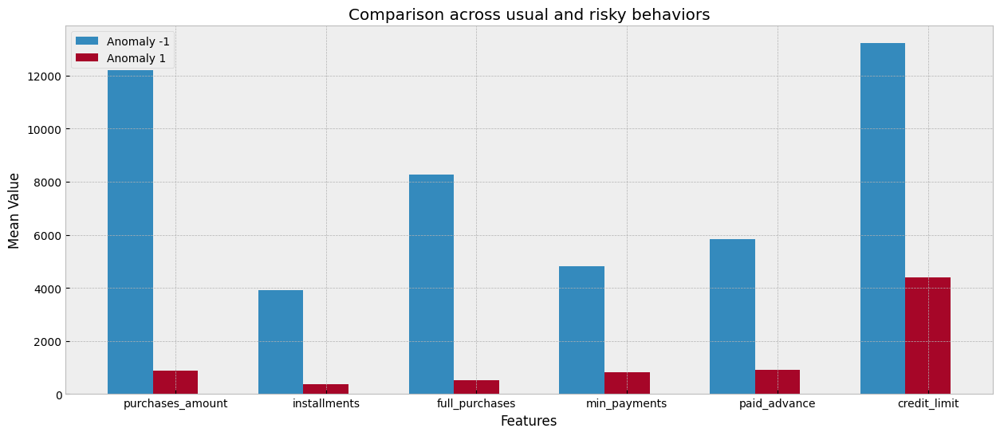

In [ ]:
def anomaly_comp_plot(df):

    features = [
      'purchases_amount', 'installments', 'full_purchases', 'min_payments', 'paid_advance',
      'credit_limit'
      ]

    # group by whether ano and calculate mean
    ano_summary = df.groupby('anomaly').mean()

    # plot each category
    def plot_ano_comparison(features, title):
        plt.figure(figsize=(15, 6))
        plt.style.use('bmh')
        x = np.arange(len(features))
        width = 0.3

        for i, ano in enumerate(ano_summary.index):
            plt.bar(x + (i * width), ano_summary.loc[ano, features], width=width, label=f'Anomaly {ano}')

        plt.xlabel("Features")
        plt.ylabel("Mean Value")
        plt.title(title)
        plt.xticks(ticks=x + width, labels=features)
        plt.legend()
        plt.show()

    # Create plot
    plot_ano_comparison(features, "Comparison across usual and risky behaviors")

plt.style.use('default')
anomaly_comp_plot(data_no_stand_w_ano)

These behaviors are characterized by significantly higher average values across these features. These customers tend to spend more, make larger purchases, and use credit more actively, which differs from the norm. IT could indicate unusual or potentially fraudulent behavior.

### Anomaly visualization
From the features above I want to explore a bit more the relationship between the amounf of money spent in the last 6 monts and the amount of payments done by the users because I make the hypthesis that a customer with high purchases but low payments is more at risk of accumulating debt.

In [ ]:
!pip install pyod #OK now I am more curious I want to see those beautiful plots we saw in the LiveCoding NB

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.6/169.6 kB 12.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyod: filename=pyod-2.0.3-py3-none-any.whl size=200466 sha256=96b535ea6f719b5688d82825689e11237f8fffc714600aa37fd8f572e54df543
  Stored in directory: /root/.cache/pip/wheels/2d/60/5b/f74eccd2c9c892a2c298202ca510f10995f9940647fcc2d97f
Successfully built pyod


In [ ]:
#data_clean_ano_for_viz = data_clean.copy() #just to be sure I don^t break anything

#### Visualizing nb of payments

In [ ]:
balance_ifmodel = IsolationForest(n_estimators=100, #number of iterations
                                 contamination=0.01) # The amount of contamination of the data set, i.e. the proportion of outliers in the data set
balance_ifmodel.fit(data_no_stand_w_ano[['payments']])

IsolationForest(contamination=0.01)

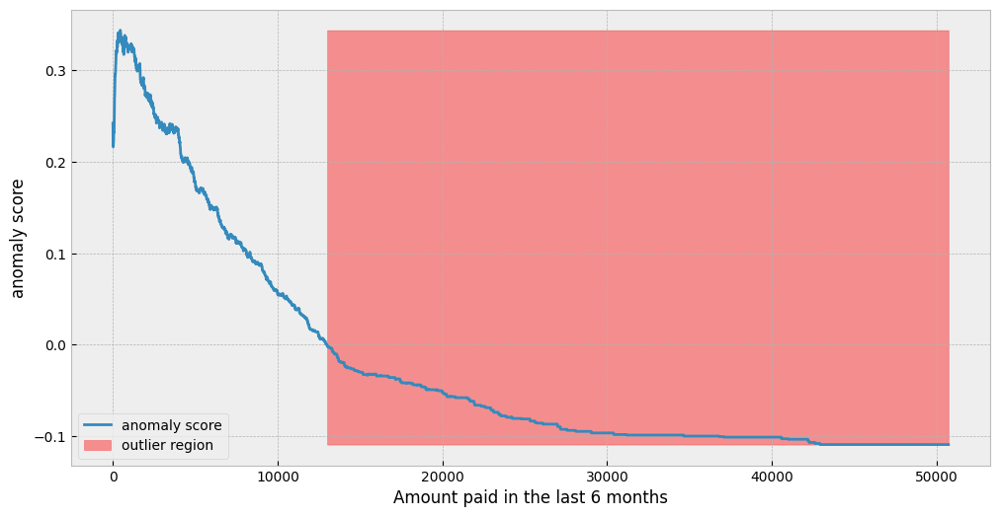

In [ ]:
xx = np.linspace(data_no_stand_w_ano['payments'].min(), data_no_stand_w_ano['payments'].max(), len(data_no_stand_w_ano)).reshape(-1,1)
anomaly_score = balance_ifmodel.decision_function(xx)
outlier = balance_ifmodel.predict(xx)
plt.figure(figsize=(12, 6))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score),
                 where=outlier==-1, color='r',
                 alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Amount paid in the last 6 months');

This is not good or bad. It depends on how much the card was used

#### Visualizing purchase amount

In [ ]:
balance_ifmodel = IsolationForest(n_estimators=100, #number of iterations
                                 contamination=0.01) # The amount of contamination of the data set, i.e. the proportion of outliers in the data set
balance_ifmodel.fit(data_no_stand_w_ano[['purchases_amount']])

IsolationForest(contamination=0.01)

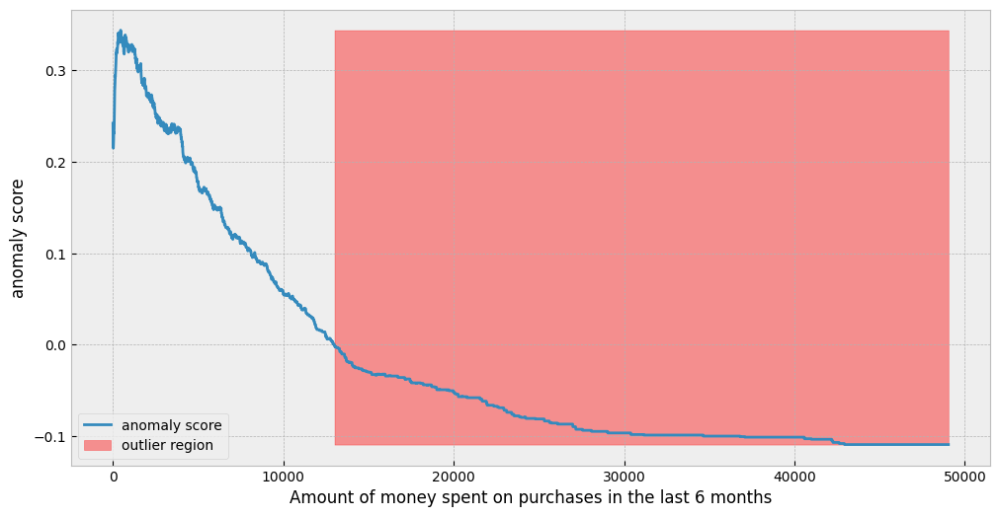

In [ ]:
xx = np.linspace(data_no_stand_w_ano['purchases_amount'].min(), data_no_stand_w_ano['purchases_amount'].max(), len(data_no_stand_w_ano)).reshape(-1,1)
anomaly_score = balance_ifmodel.decision_function(xx)
outlier = balance_ifmodel.predict(xx)
plt.figure(figsize=(12, 6))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score),
                 where=outlier==-1, color='r',
                 alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Amount of money spent on purchases in the last 6 months');

In [ ]:
data_no_stand_w_ano.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   balance_account                   8500 non-null   float64
 1   purchases_amount                  8500 non-null   float64
 2   paid_advance                      8500 non-null   float64
 3   full_purchases                    8500 non-null   float64
 4   balance_frequency_update          8500 non-null   float64
 5   installments                      8500 non-null   float64
 6   purchases_frequency               8500 non-null   float64
 7   full_purchases_frequency          8500 non-null   float64
 8   purchases_installments_frequency  8500 non-null   float64
 9   cash_advance_frequency            8500 non-null   float64
 10  nr_cash_advances                  8500 non-null   int64  
 11  nr_purchases                      8500 non-null   int64  
 12  credit

## Not working =(

In [ ]:
### From the MLG_D8_LC1_Case_Study_Anomaly_Detection_of_Retail_Store_Sales Notebook
def visualize_anomalies(model, xx, yy, data_df, ax_obj, subplot_title):

    # predict raw anomaly score
    scores_pred = model.decision_function(data_df) * -1
    # prediction of a datapoint category outlier or inlier
    y_pred = model.predict(data_df)
    n_inliers = len(y_pred) - np.count_nonzero(y_pred)
    n_outliers = np.count_nonzero(y_pred == 1)


    out_df = data_df.copy(deep=True)
    out_df['Outlier'] = y_pred.tolist()
    # discount - inlier feature 1,  profit - inlier feature 2
    inliers_discount = out_df[out_df['Outlier'] == 0]['Discount'].values
    inliers_profit = out_df[out_df['Outlier'] == 0]['Profit'].values
    # discount - outlier feature 1, profit - outlier feature 2
    outliers_discount = out_df[out_df['Outlier'] == 1]['Discount'].values
    outliers_profit = out_df[out_df['Outlier'] == 1]['Profit'].values

    # Use threshold value to consider a datapoint inlier or outlier
    # threshold = stats.scoreatpercentile(scores_pred,100 * outliers_fraction)
    threshold = np.percentile(scores_pred, 100 * outliers_fraction)
    # decision function calculates the raw anomaly score for every point
    Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
    Z = Z.reshape(xx.shape)
    # fill blue map colormap from minimum anomaly score to threshold value
    ax_obj.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
    # draw red contour line where anomaly score is equal to thresold
    a = ax_obj.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
    # fill orange contour lines where range of anomaly score is from threshold to maximum anomaly score
    ax_obj.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
    b = ax_obj.scatter(inliers_discount, inliers_profit, c='white',s=20, edgecolor='k')
    c = ax_obj.scatter(outliers_discount, outliers_profit, c='black',s=20, edgecolor='k')


    ax_obj.legend([a.collections[0], b,c], ['learned decision function', 'inliers','outliers'],
               prop=matplotlib.font_manager.FontProperties(size=10),loc='upper right')

    ax_obj.set_xlim((0, 1))
    ax_obj.set_ylim((0, 1))
    ax_obj.set_xlabel('Discount')
    ax_obj.set_ylabel('Sales')
    ax_obj.set_title(subplot_title)

I think I can only visualize 2 features

In [ ]:
cols = ['purchases_amount', 'payments'] #need to work on the scaled one I think
subset_df = data_clean[cols]
subset_df.head()

,purchases_amount,payments
0,-0.414083,-0.563901
1,-0.394260,-0.576049
2,-0.464035,-0.490219
3,-0.295433,-0.351538
4,-0.419933,0.820251


In [ ]:
from pyod.models import iforest

In [ ]:
if_model = iforest.IForest(n_estimators=100, contamination=0.01)
if_model.fit(subset_df)

IForest(behaviour='old', bootstrap=False, contamination=0.01,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=1,
    random_state=None, verbose=0)

ValueError: Contour levels must be increasing

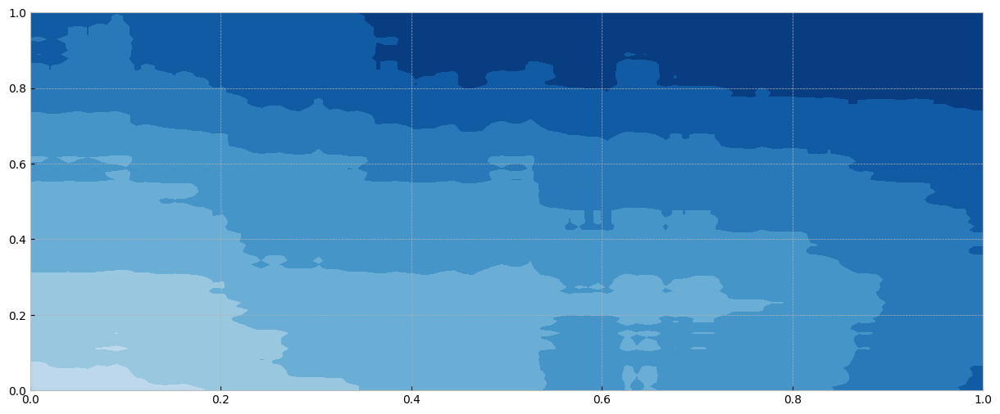

In [ ]:
fig, ax_obj = plt.subplots(figsize = (15, 6))

# predict raw anomaly score
scores_pred = if_model.decision_function(subset_df) * -1

# prediction of a datapoint category outlier or inlier
y_pred = if_model.predict(subset_df)
n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)

# Copy subset_df and add outlier column
out_df = subset_df.copy(deep=True)
out_df['Outlier'] = y_pred.tolist()

# Amount spent and paid for inliers
inliers_spent = out_df[out_df['Outlier'] == 0]['purchases_amount'].values
inliers_paid = out_df[out_df['Outlier'] == 0]['payments'].values

# Amount spent and paid for outliers
outliers_spent = out_df[out_df['Outlier'] == 1]['purchases_amount'].values
outliers_paid = out_df[out_df['Outlier'] == 1]['payments'].values

# Use percentile threshold to categorize data
threshold = np.percentile(scores_pred, 95)

# Decision function calculates the raw anomaly score for each point
Z = if_model.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
Z = Z.reshape(xx.shape)

# Determine minimum and maximum levels
min_level = min(Z.min(), threshold)
max_level = max(Z.max(), threshold)

# Create levels for contour plot
levels = np.linspace(min_level, max_level, 10)

# Fill blue map colormap from minimum anomaly score to threshold value
a = ax_obj.contourf(xx, yy, Z, levels=levels, cmap=plt.cm.Blues_r)

# Draw red contour line where anomaly score is equal to threshold
b = ax_obj.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')

# Fill orange contour lines where anomaly score is between threshold and maximum
c = ax_obj.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')

# Scatter plot for inliers (customers with low anomaly score)
d = ax_obj.scatter(inliers_spent, inliers_paid, c='white', s=20, edgecolor='k')

# Scatter plot for outliers (customers with high anomaly score)
e = ax_obj.scatter(outliers_spent, outliers_paid, c='black', s=20, edgecolor='k')

# Add legend with each plot element
"""
ax_obj.legend(
    [a, b.collections[0], c, d, e],
    ['learned decision function', 'anomaly threshold', 'range of anomaly scores', 'inliers', 'outliers'],
    prop=plt.font_manager.FontProperties(size=10),
    loc='upper right'
)
"""

# Set axis limits and labels
ax_obj.set_xlim((0, 1))
ax_obj.set_ylim((0, 1))
ax_obj.set_xlabel('amount spent')
ax_obj.set_ylabel('amount paid')
ax_obj.set_title('Isolation Forest for amount paid by amount spent')

plt.show()

In [ ]:
print("Threshold:", threshold)
print("Min anomaly score:", Z.min())
print("Max anomaly score:", Z.max())

Threshold: -3.2420344874835956e-17
Min anomaly score: 0.20794884397552515
Max anomaly score: 0.3296210478310122
